<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Import-Standard-Data-Science-Packages" data-toc-modified-id="Import-Standard-Data-Science-Packages-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Import Standard Data Science Packages</a></span><ul class="toc-item"><li><span><a href="#Set-Colorblind-Friendly-Palette" data-toc-modified-id="Set-Colorblind-Friendly-Palette-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Set Colorblind-Friendly Palette</a></span></li></ul></li><li><span><a href="#Load-and-Visualise-dPCR-Data" data-toc-modified-id="Load-and-Visualise-dPCR-Data-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Load and Visualise dPCR Data</a></span></li><li><span><a href="#Data-Analysis" data-toc-modified-id="Data-Analysis-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Data Analysis</a></span><ul class="toc-item"><li><span><a href="#Organise-Data" data-toc-modified-id="Organise-Data-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Organise Data</a></span></li><li><span><a href="#Define-ACA-Model-(Neural-Network)" data-toc-modified-id="Define-ACA-Model-(Neural-Network)-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Define ACA Model (Neural Network)</a></span></li><li><span><a href="#Train-and-Compute-Performance-(10-Fold-Cross-Val)" data-toc-modified-id="Train-and-Compute-Performance-(10-Fold-Cross-Val)-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>Train and Compute Performance (10-Fold Cross Val)</a></span></li><li><span><a href="#Visualise-AMCA-Coefficients" data-toc-modified-id="Visualise-AMCA-Coefficients-3.4"><span class="toc-item-num">3.4&nbsp;&nbsp;</span>Visualise AMCA Coefficients</a></span></li><li><span><a href="#Compute-Performance-as-a-Function-of-Training-Volume" data-toc-modified-id="Compute-Performance-as-a-Function-of-Training-Volume-3.5"><span class="toc-item-num">3.5&nbsp;&nbsp;</span>Compute Performance as a Function of Training Volume</a></span></li></ul></li></ul></div>

# Import Standard Data Science Packages

In [4]:
import os
import sys
from joblib import Parallel, delayed
from tqdm.auto import tqdm
from pathlib import Path
from cycler import cycler
import pickle

import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.colors import to_hex
from matplotlib.lines import Line2D
import seaborn as sns

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import StratifiedShuffleSplit, StratifiedKFold, KFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
import statsmodels.api as sm
from sklearn.linear_model import LogisticRegressionCV

from scipy.stats import chi2
from scipy.stats import bartlett, ttest_ind

## Set Colorblind-Friendly Palette

In [5]:
mpl.rcParams['axes.prop_cycle'] = cycler(color=[to_hex(i) for i in [
    (0.00, 0.45, 0.70),  # 1. Deep Blue (High contrast dark anchor)
    (0.90, 0.60, 0.00),  # 2. Orange (Distinct from yellow by saturation)
    (0.35, 0.70, 0.90),  # 3. Sky Blue (Lighter blue)
    (0.00, 0.60, 0.50),  # 4. Teal / Bluish Green (Heavy blue mix, safe for red-green CVD)
    (0.95, 0.90, 0.25),  # 5. Bright Yellow (Maximum luminance anchor)
    (0.80, 0.40, 0.70),  # 6. Pink / Magenta (Acts as a safe substitute for red)
    (0.20, 0.13, 0.53),  # 7. Indigo / Dark Purple (Distinct from Deep Blue by hue)
    (0.87, 0.80, 0.47),  # 8. Sand / Pale Gold (Muted yellow-brown)
    (0.27, 0.67, 0.60),  # 9. Mint / Seafoam (Lighter, desaturated teal)
    (0.65, 0.65, 0.65)   # 10. Medium Grey (Neutral baseline)
]])

# Load and Visualise dPCR Data

In [6]:
%load_ext autoreload
%autoreload
import chip_utilities as utils

sys.path.insert(0, '..')
import sigmoid_fitting as sp

def _process_single_row(y, X):
    return sp.extract_kinetic_parameters_original(X, y)

def extract_kinetic_features(df, n_jobs=-1):
    cycle_cols = df.filter(like="Cycle").columns
    X = [col.replace("Cycle", "") for col in cycle_cols]
    
    y_values_array = df[cycle_cols].values
    
    features = Parallel(n_jobs=n_jobs)(
        delayed(_process_single_row)(y, X) for y in y_values_array
    )
    
    return pd.DataFrame(features)

def plot_single_curve(row):
    plt.plot(row.filter(like="Cycle").values.T)
    plt.show()

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [7]:
exp_folder = "/Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/Run Data/trial test data/"
exp_path = Path(exp_folder, "D20250808_E00_C00_F4500KHz_U_Sample_7")
sigmoid_data_path = f'{exp_path}/normalised_ori_ac_df.csv'

result_path = exp_path / 'processed_chip_data.csv'
chip_data = pd.read_csv(result_path, index_col="Unnamed: 0")

## Define ACA Model (Neural Network)

In [8]:
import tensorflow as tf
from scikeras.wrappers import KerasClassifier

class myWrapper(KerasClassifier):
    # def predict(self, X):
    #     return self.model.predict(X).argmax(axis=1)
    
    # def predict_proba(self, X):
    #     return self.model.predict(X)
    pass

display(f'TF VERSION: {tf.__version__}')

def create_model(input_size, output_size, kernel_size_1=5, kernel_size_2=3): 
    inputs = tf.keras.layers.Input(shape=(input_size, 1))
    
    x = tf.keras.layers.Conv1D(16, kernel_size_1, activation='relu')(inputs)
    x = tf.keras.layers.Conv1D(8, kernel_size_2, activation='relu')(x)
    
    x = tf.keras.layers.Flatten()(x)
    x = tf.keras.layers.Dense(output_size, activation='softmax')(x)
    
    model = tf.keras.models.Model(inputs=inputs, outputs=x)
    model.compile(optimizer='adam', 
                  loss='sparse_categorical_crossentropy', 
                  metrics=['accuracy'])
    return model

'TF VERSION: 2.21.0'

## Train clean data + Test on outlier

In [9]:
outlier_filters = [None] + list(chip_data.iloc[:,-14:].columns)

cycle_cols = [c for c in chip_data.columns if "Cycle" in c]
X_AC_full = chip_data[cycle_cols].values
X_FFI_full = X_AC_full[:, [-1]]

encoder = LabelEncoder()
y_full = encoder.fit_transform(chip_data['well'])

exp_folder = "/Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/Run Data/trial test data/"
exp_path = Path(exp_folder) / "D20250808_E00_C00_F4500KHz_U_Sample_7"
exp_path.mkdir(parents=True, exist_ok=True)

result_path = exp_path / 'outlier_free_test_on_outlier.pkl'

if os.path.exists(result_path):
    print(f"Loading existing results from {result_path}...")
    with open(result_path, 'rb') as f:
        outlier_free_results = pickle.load(f)
else:
    print("No existing results found. Initializing new dictionary.")
    outlier_free_results = {}


for outlier_filter in outlier_filters:
    if outlier_filter in outlier_free_results:
        print(f"Skipping {outlier_filter} (already exists in results).")
        continue

    print(f"\nTraining on {outlier_filter} data")
    
    if outlier_filter is None:
        mask = np.ones(len(chip_data), dtype=bool)
    else:
        mask = (chip_data[outlier_filter] == 1).values

    # Train on normal (mask), test on outliers (~mask)
    X_AC_train, X_AC_test = X_AC_full[mask], X_AC_full[~mask]
    X_FFI_train, X_FFI_test = X_FFI_full[mask], X_FFI_full[~mask]
    y_train, y_test = y_full[mask], y_full[~mask]

    # --- SAFETY CHECK ---
    # If there are no outliers to test on (e.g., the 'None' filter), skip this filter
    if len(y_test) == 0:
        print(f"No outliers found for {outlier_filter}. Skipping.")
        continue

    print(f"Train size (Normal): {len(y_train)} | Test size (Outliers): {len(y_test)}")

    y_trues_ = []
    y_preds_AC_ = []
    y_preds_AC_kNN_ = []
    y_preds_FFI_ = []

    y_trues_.append(y_test)

    # ==========================================
    # Neural Network (AC)
    # ==========================================
    clf_AC = myWrapper(model=create_model,
                        model__input_size=X_AC_train.shape[1], # FIXED: changed X_AC to X_AC_train
                        model__output_size=len(np.unique(y_full)),
                        epochs=1000, 
                        batch_size=512, 
                        shuffle=True,
                        verbose=False)
    clf_AC.fit(X_AC_train, y_train)
    y_preds_AC_.append(clf_AC.predict(X_AC_test))
    tf.keras.backend.clear_session()

    # ==========================================
    # K-Nearest Neighbors (AC)
    # ==========================================
    clf_AC_kNN = KNeighborsClassifier(n_neighbors=10, n_jobs=-1)
    clf_AC_kNN.fit(X_AC_train, y_train)
    y_preds_AC_kNN_.append(clf_AC_kNN.predict(X_AC_test))

    # ==========================================
    # Logistic Regression (FFI)
    # ==========================================
    clf_FFI = LogisticRegression(max_iter=1000, n_jobs=-1)
    clf_FFI.fit(X_FFI_train, y_train)
    y_preds_FFI_.append(clf_FFI.predict(X_FFI_test))
        
    outlier_free_results[outlier_filter] = {
        "y_trues": np.concatenate(y_trues_),
        "y_preds_AC": np.concatenate(y_preds_AC_),
        "y_preds_AC_kNN": np.concatenate(y_preds_AC_kNN_),
        "y_preds_FFI": np.concatenate(y_preds_FFI_),
        "y_trues_": y_trues_,
        "y_preds_AC_": y_preds_AC_,
        "y_preds_AC_kNN_": y_preds_AC_kNN_,
        "y_preds_FFI_": y_preds_FFI_,
    }

    with open(result_path, 'wb') as f:
        pickle.dump(outlier_free_results, f)
    print(f"Results saved to {result_path}")
    print("-"*50)

No existing results found. Initializing new dictionary.

Training on None data
No outliers found for None. Skipping.

Training on msc_label_0.001 data
Train size (Normal): 12013 | Test size (Outliers): 34
Results saved to /Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/Run Data/trial test data/D20250808_E00_C00_F4500KHz_U_Sample_7/outlier_free_test_on_outlier.pkl
--------------------------------------------------

Training on amf_label_Send data
Train size (Normal): 10463 | Test size (Outliers): 1584
Results saved to /Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/Run Data/trial test data/D20250808_E00_C00_F4500KHz_U_Sample_7/outlier_free_test_on_outlier.pkl
--------------------------------------------------

Training on amf_label_Send_abs data
Train size (Normal): 10444 | Test size (Outliers): 1603
Results saved to /Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/Run Data/trial test da

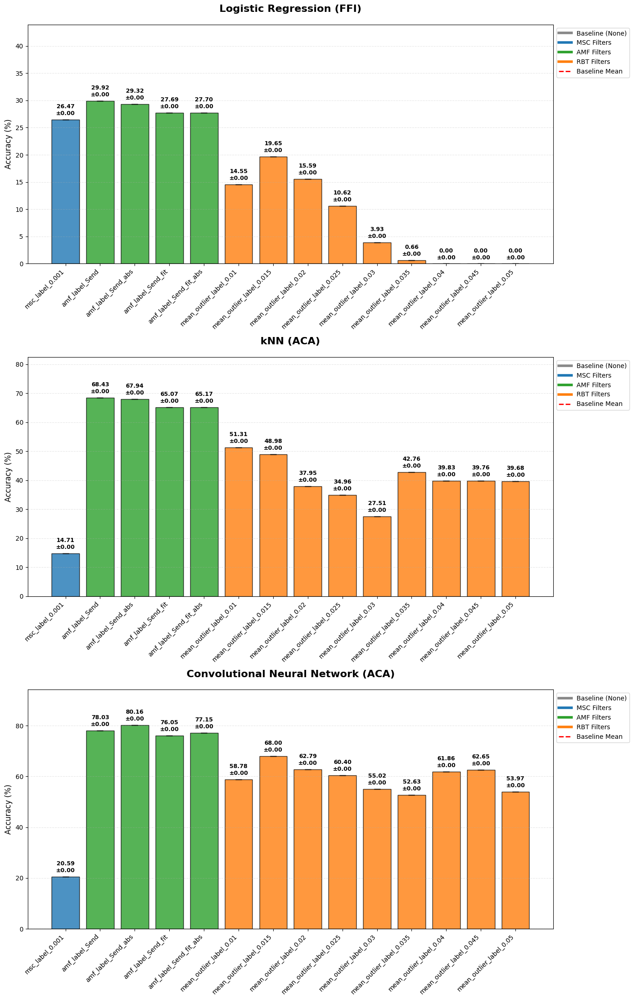

In [15]:
# 1. Setup filters and labels
base_filters = [f for f in outlier_filters if f is None or not f.startswith('mean_outlier_label_')]
mean_filters = [f for f in outlier_filters if f is not None and f.startswith('mean_outlier_label_')]
mean_filters_sorted = sorted(mean_filters, key=lambda x: float(x.split('_')[-1]))
outlier_filters = base_filters + mean_filters_sorted
filter_labels = [str(f) if f is not None else "No Filter" for f in outlier_filters]
outlier_filters = outlier_filters[1:]
filter_labels = filter_labels[1:]
# Define methods and the corresponding list-of-folds keys in outlier_free_results
method_info = [
    ('Logistic Regression (FFI)', 'y_preds_FFI_'),
    ('kNN (ACA)', 'y_preds_AC_kNN_'),
    ('Convolutional Neural Network (ACA)', 'y_preds_AC_')
]

# 2. Logic-based color palette
colors = []
for f in outlier_filters:
    if f is None:
        colors.append('#888888') # Grey
    elif f.startswith('msc_'):
        colors.append('#1f77b4') # Blue
    elif f.startswith('amf_'):
        colors.append('#2ca02c') # Green
    elif f.startswith('mean_'):
        colors.append('#ff7f0e') # Orange
    else:
        colors.append('#9467bd') # Purple

# 3. Data Extraction and Averaging
acc_means_by_method = {m_key: [] for _, m_key in method_info}
acc_stds_by_method = {m_key: [] for _, m_key in method_info}
# baseline_stats = {} # To store mean and std for the 'None' filter

for f in outlier_filters:
    if f == None:
        continue
    res = outlier_free_results[f]
    y_trues_folds = res['y_trues_'] # List of arrays per fold
    
    for _, m_key in method_info:
        y_preds_folds = res[m_key] # List of predicted arrays per fold
        
        # Calculate accuracy for each fold
        fold_accuracies = [
            accuracy_score(y_tr, y_pred) * 100 
            for y_tr, y_pred in zip(y_trues_folds, y_preds_folds)
        ]
        
        mean_val = np.mean(fold_accuracies)
        std_val = np.std(fold_accuracies)
        
        acc_means_by_method[m_key].append(mean_val)
        acc_stds_by_method[m_key].append(std_val)
        
        # Capture baseline stats for the red line
        # if f is None:
        #     baseline_stats[m_key] = (mean_val, std_val)

# 4. Plotting
fig, axes = plt.subplots(len(method_info), 1, figsize=(14, 22))

for ax, (title, m_key) in zip(axes, method_info):
    means = acc_means_by_method[m_key]
    stds = acc_stds_by_method[m_key]
    # base_mean, base_std = baseline_stats[m_key]
    
    # Create the custom labels: "mean ± std"
    bar_labels = [f'{m:.2f}\n±{s:.2f}' for m, s in zip(means, stds)]
    
    # Plot bars with error bars (yerr)
    bars = ax.bar(filter_labels, means, yerr=stds, color=colors, 
                  edgecolor='black', alpha=0.8, capsize=5)
    
    # Add horizontal baseline based on 'None' mean
    # ax.axhline(y=base_mean, color='red', linestyle='--', linewidth=2, 
    #            label=f'Baseline ({base_mean:.2f}%)')
    
    # Add the text labels on top
    ax.bar_label(bars, labels=bar_labels, padding=5, fontsize=9, fontweight='bold')
    
    # Formatting
    ax.set_title(title, fontsize=16, fontweight='bold', pad=20)
    ax.set_ylabel('Accuracy (%)', fontsize=12)
    ax.set_ylim(0, min(100, max(means) + max(stds)) + 14) # Dynamic height
    
    ax.set_xticks(range(len(filter_labels)))
    ax.set_xticklabels(filter_labels, rotation=45, ha='right', fontsize=10)
    ax.grid(axis='y', linestyle='--', alpha=0.3)
    
    # Custom Legend
    legend_elements = [
        Line2D([0], [0], color='#888888', lw=4, label='Baseline (None)'),
        Line2D([0], [0], color='#1f77b4', lw=4, label='MSC Filters'),
        Line2D([0], [0], color='#2ca02c', lw=4, label='AMF Filters'),
        Line2D([0], [0], color='#ff7f0e', lw=4, label='RBT Filters'),
        Line2D([0], [0], color='red', linestyle='--', lw=2, label='Baseline Mean')
    ]
    ax.legend(handles=legend_elements, loc='upper left', bbox_to_anchor=(1, 1))

plt.tight_layout()
plt.show()

In [28]:
chip_data

,row_min,row_max,row_range,well,Cycle71.10000000000001,Cycle74.89999999999999,Cycle78.7,Cycle82.49999999999999,Cycle86.3,Cycle90.10000000000001,...,amf_label_Send_fit_abs,mean_outlier_label_0.01,mean_outlier_label_0.015,mean_outlier_label_0.02,mean_outlier_label_0.025,mean_outlier_label_0.03,mean_outlier_label_0.035,mean_outlier_label_0.04,mean_outlier_label_0.045,mean_outlier_label_0.05
0,0.209451,0.239304,0.029854,0,0.219883,0.225581,0.221032,0.223199,0.226792,0.220374,...,1.0,-1.0,-1.0,-1.0,1.0,1.0,1.0,1.0,1.0,1.0
1,0.197048,0.227095,0.030047,0,0.219883,0.225896,0.222948,0.219505,0.218379,0.214700,...,-1.0,-1.0,-1.0,-1.0,1.0,1.0,1.0,1.0,1.0,1.0
2,0.190823,0.223456,0.032633,0,0.219883,0.215283,0.218522,0.220078,0.218136,0.211950,...,-1.0,-1.0,-1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
3,0.201863,0.221085,0.019222,0,0.219883,0.218566,0.215485,0.221085,0.219090,0.216118,...,1.0,-1.0,-1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
4,0.203428,0.228837,0.025409,0,0.219883,0.223504,0.219256,0.222212,0.222212,0.211433,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12042,0.204426,0.251528,0.047101,9,0.219883,0.212798,0.217083,0.216068,0.213642,0.222143,...,1.0,-1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
12043,0.207171,0.247582,0.040411,9,0.219883,0.217447,0.216881,0.216600,0.222078,0.223117,...,1.0,-1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
12044,0.198757,0.232081,0.033324,9,0.219883,0.213518,0.208993,0.212903,0.213056,0.213982,...,1.0,-1.0,-1.0,-1.0,1.0,1.0,1.0,1.0,1.0,1.0
12045,0.211202,0.247758,0.036556,9,0.219883,0.221449,0.220142,0.220532,0.219624,0.220272,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [21]:
outlier_filters

[None,
 'msc_label_0.001',
 'amf_label_Send',
 'amf_label_Send_abs',
 'amf_label_Send_fit',
 'amf_label_Send_fit_abs',
 'mean_outlier_label_0.01',
 'mean_outlier_label_0.015',
 'mean_outlier_label_0.02',
 'mean_outlier_label_0.025',
 'mean_outlier_label_0.03',
 'mean_outlier_label_0.035',
 'mean_outlier_label_0.04',
 'mean_outlier_label_0.045',
 'mean_outlier_label_0.05']

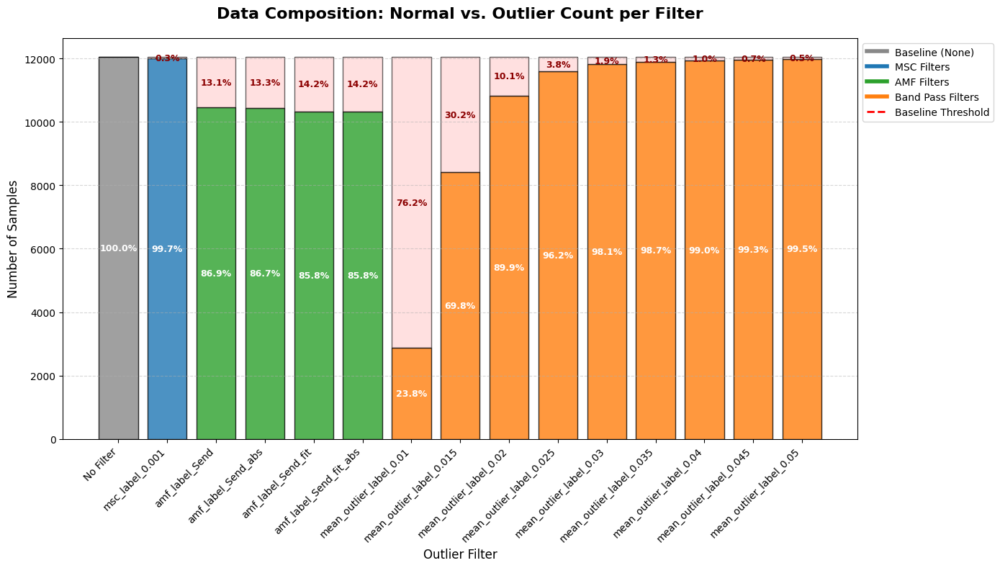

In [22]:
import matplotlib.pyplot as plt
import numpy as np

# 1. Setup Data and Colors
base_filters = [f for f in outlier_filters if f is None or not f.startswith('mean_outlier_label_')]
mean_filters = [f for f in outlier_filters if f is not None and f.startswith('mean_outlier_label_')]
mean_filters_sorted = sorted(mean_filters, key=lambda x: float(x.split('_')[-1]))
outlier_filters = base_filters + mean_filters_sorted
filter_labels = [str(f) if f is not None else "No Filter" for f in outlier_filters]

n_normals = []
n_outliers = []

total_count = len(chip_data)

for f in outlier_filters:
    # Logic to get counts
    if f is None:
        mask = np.ones(total_count, dtype=bool)
    else:
        mask = (chip_data[f] == 1).values

    n_normal = np.sum(mask)
    n_outlier = total_count - n_normal
    
    n_normals.append(n_normal)
    n_outliers.append(n_outlier)

# 2. Plotting
fig, ax = plt.subplots(figsize=(14, 8))

# Bottom stack: Normal data
# Using your categorical colors here
bars_normal = ax.bar(filter_labels, n_normals, color=colors, 
                     edgecolor='black', alpha=0.8, label='Normal')

# Top stack: Outlier data
# Using a consistent light red/grey to show discarded volume
bars_outlier = ax.bar(filter_labels, n_outliers, bottom=n_normals, 
                      color='#ffcccc', edgecolor='black', alpha=0.6, label='Outlier')

# 3. Add percentage labels on the stacks
for i in range(len(filter_labels)):
    # Label for Normal portion
    if n_normals[i] > 0:
        ax.text(i, n_normals[i]/2, f'{(n_normals[i]/total_count)*100:.1f}%', 
                ha='center', va='center', color='white', fontweight='bold', fontsize=9)
    
    # Label for Outlier portion
    if n_outliers[i] > 0:
        ax.text(i, n_normals[i] + (n_outliers[i]/2), f'{(n_outliers[i]/total_count)*100:.1f}%', 
                ha='center', va='center', color='darkred', fontweight='bold', fontsize=9)

# 4. Formatting
ax.set_title("Data Composition: Normal vs. Outlier Count per Filter", fontsize=16, fontweight='bold', pad=20)
ax.set_ylabel("Number of Samples", fontsize=12)
ax.set_xlabel("Outlier Filter", fontsize=12)

ax.legend(handles=legend_elements, loc='upper left', bbox_to_anchor=(1, 1))

plt.ylim(0, mask.shape[0]*1.05)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

In [ ]:
n_samples_by_method = {m_key: [] for _, m_key in method_info}

for f in filters:
    res = outlier_free_results[f]
    y_trues_folds = res['y_trues_'] # List of arrays per fold
    
    for _, m_key in method_info:
        y_preds_folds = res[m_key] # List of predicted arrays per fold
        
        # Calculate accuracy for each fold
        fold_accuracies = [
            accuracy_score(y_tr, y_pred) * 100 
            for y_tr, y_pred in zip(y_trues_folds, y_preds_folds)
        ]
        
        mean_val = np.mean(fold_accuracies)
        std_val = np.std(fold_accuracies)
        
        acc_means_by_method[m_key].append(mean_val)
        acc_stds_by_method[m_key].append(std_val)
        
        # Capture baseline stats for the red line
        if f is None:
            baseline_stats[m_key] = (mean_val, std_val)

# 4. Plotting
fig, axes = plt.subplots(len(method_info), 1, figsize=(14, 22))

for ax, (title, m_key) in zip(axes, method_info):
    means = acc_means_by_method[m_key]
    stds = acc_stds_by_method[m_key]
    base_mean, base_std = baseline_stats[m_key]
    
    # Create the custom labels: "mean ± std"
    bar_labels = [f'{m:.2f}\n±{s:.2f}' for m, s in zip(means, stds)]
    
    # Plot bars with error bars (yerr)
    bars = ax.bar(filter_labels, means, yerr=stds, color=colors, 
                  edgecolor='black', alpha=0.8, capsize=5)
    
    # Add horizontal baseline based on 'None' mean
    ax.axhline(y=base_mean, color='red', linestyle='--', linewidth=2, 
               label=f'Baseline ({base_mean:.2f}%)')
    
    # Add the text labels on top
    ax.bar_label(bars, labels=bar_labels, padding=5, fontsize=9, fontweight='bold')
    
    # Formatting
    ax.set_title(title, fontsize=16, fontweight='bold', pad=20)
    ax.set_ylabel('Accuracy (%)', fontsize=12)
    ax.set_ylim(0, min(100, max(means) + max(stds)) + 15) # Dynamic height
    
    ax.set_xticks(range(len(filter_labels)))
    ax.set_xticklabels(filter_labels, rotation=45, ha='right', fontsize=10)
    ax.grid(axis='y', linestyle='--', alpha=0.3)
    
    # Custom Legend
    legend_elements = [
        Line2D([0], [0], color='#888888', lw=4, label='Baseline (None)'),
        Line2D([0], [0], color='#1f77b4', lw=4, label='MSC Filters'),
        Line2D([0], [0], color='#2ca02c', lw=4, label='AMF Filters'),
        Line2D([0], [0], color='#ff7f0e', lw=4, label='Band Pass Filters'),
        Line2D([0], [0], color='red', linestyle='--', lw=2, label='Baseline Mean')
    ]
    ax.legend(handles=legend_elements, loc='upper left', bbox_to_anchor=(1, 1))

plt.tight_layout()
plt.show()

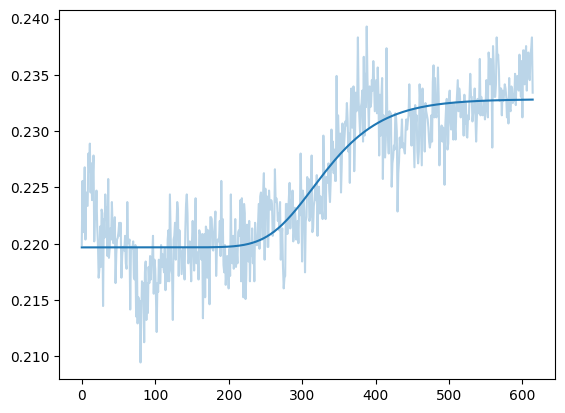

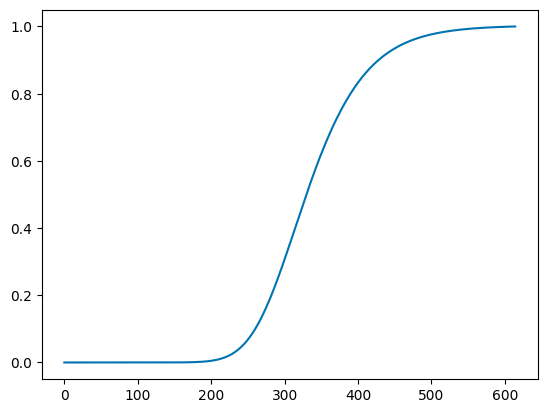

In [134]:
dummy = chip_data["5p_sigmoid_fitted"][0].T
dummy_norm = (dummy-min(dummy))/(max(dummy)-min(dummy))
plt.plot(chip_data.iloc[0,:].filter(like="Cycle").values.T, alpha=0.3, color="#1f77b4")
plt.plot(dummy, color="#1f77b4")
plt.show()
plt.plot(dummy_norm)
plt.show()

In [ ]:

# acc_for_each_fold = lambda x: [accuracy_score(i, j) for i, j in zip(x, y_trues_)]

# acc_dict = {'FFI': acc_for_each_fold(y_preds_FFI_),
#             'ACA': acc_for_each_fold(y_preds_AC_),
#             # 'MCA': acc_for_each_fold(y_preds_MC_),
#             # 'AMCA': acc_for_each_fold(y_preds_)
#             }
# acc = pd.DataFrame(acc_dict)

# normality_test = lambda x: sm.stats.lilliefors(x)[1]

# # variance_test = lambda x: bartlett(x, acc['AMCA'])[1]

# # ttest = lambda x: ttest_ind(x, acc['AMCA'], equal_var=False)[1]

# # statistics = lambda x: [np.mean(x), np.std(x), normality_test(x), variance_test(x), ttest(x)]

# # stats = pd.DataFrame({k: statistics(acc[k]) for k in acc.columns})

# # stats.index = ['Mean Acc.', 'Std Acc.', 'Normality p-val.', 'Equal Var. p-val', 'Ttest p-val']

# # pd.set_option('display.float_format', lambda x: f'{x:.4f}')

# # stats

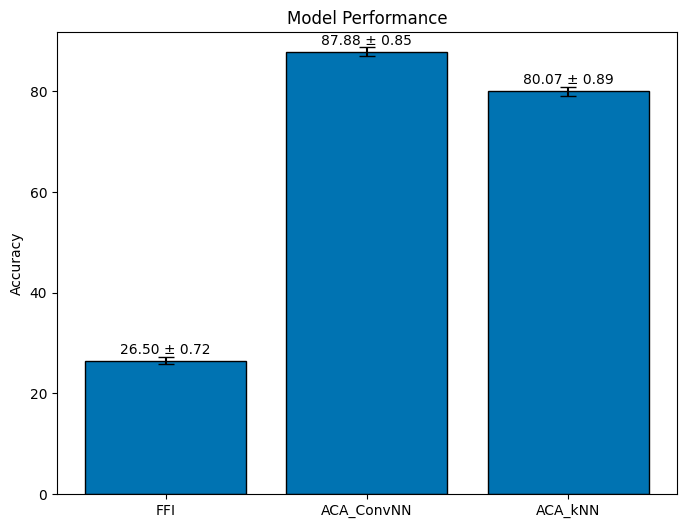

In [15]:
classes = encoder.classes_

ypreds_methods = [y_preds_FFI_, y_preds_AC_, y_preds_AC_kNN_] #, y_preds_MC_, y_preds_]
titles = ['Final Fluorescence Intensity',
          'Amplification Curve Analysis',
          'Amplification Curve Analysis (kNN)'] #,
        #   'Melting Curve Analysis',
        #   'Amplification and Melting Curve Analysis']
short_names = ['FFI', 'ACA_ConvNN', 'ACA_kNN']#, 'MCA', 'AMCA']
accs_mean = []
accs_std = []
for yps in ypreds_methods:
    acc_temp = []
    for yp, y_tr in zip(yps, y_trues_):
        acc_temp.append(accuracy_score(y_tr, yp)*100)
    accs_mean.append(np.mean(acc_temp))
    accs_std.append(np.std(acc_temp))

custom_labels = [f'{a:.2f} ± {s:.2f}' for a, s in zip(accs_mean, accs_std)]

fig, ax = plt.subplots(figsize=(8, 6))
bars = ax.bar(short_names, accs_mean, yerr=accs_std, capsize=6, edgecolor='black')
ax.bar_label(bars, labels=custom_labels, padding=0, fontsize=10)
ax.set_ylim(0, max(accs_mean) + max(accs_std) + 3)
ax.set_ylabel('Accuracy')
ax.set_title('Model Performance')

plt.show()

In [16]:
print(short_names)
print(accs_mean)
print(accs_std)

['FFI', 'ACA_ConvNN', 'ACA_kNN']
[np.float64(26.5044664396686), np.float64(87.88083980094015), np.float64(80.06971919328382)]
[np.float64(0.718598424850021), np.float64(0.8451281696839423), np.float64(0.8943081325705065)]


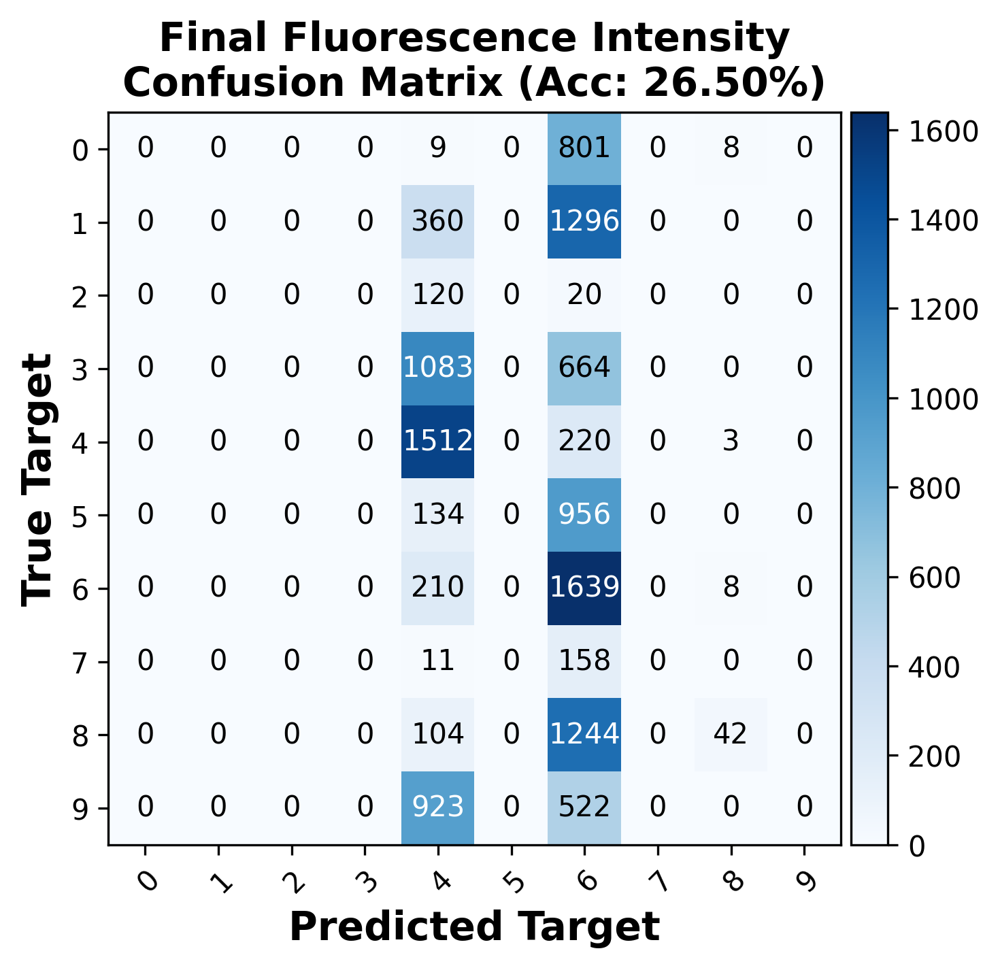

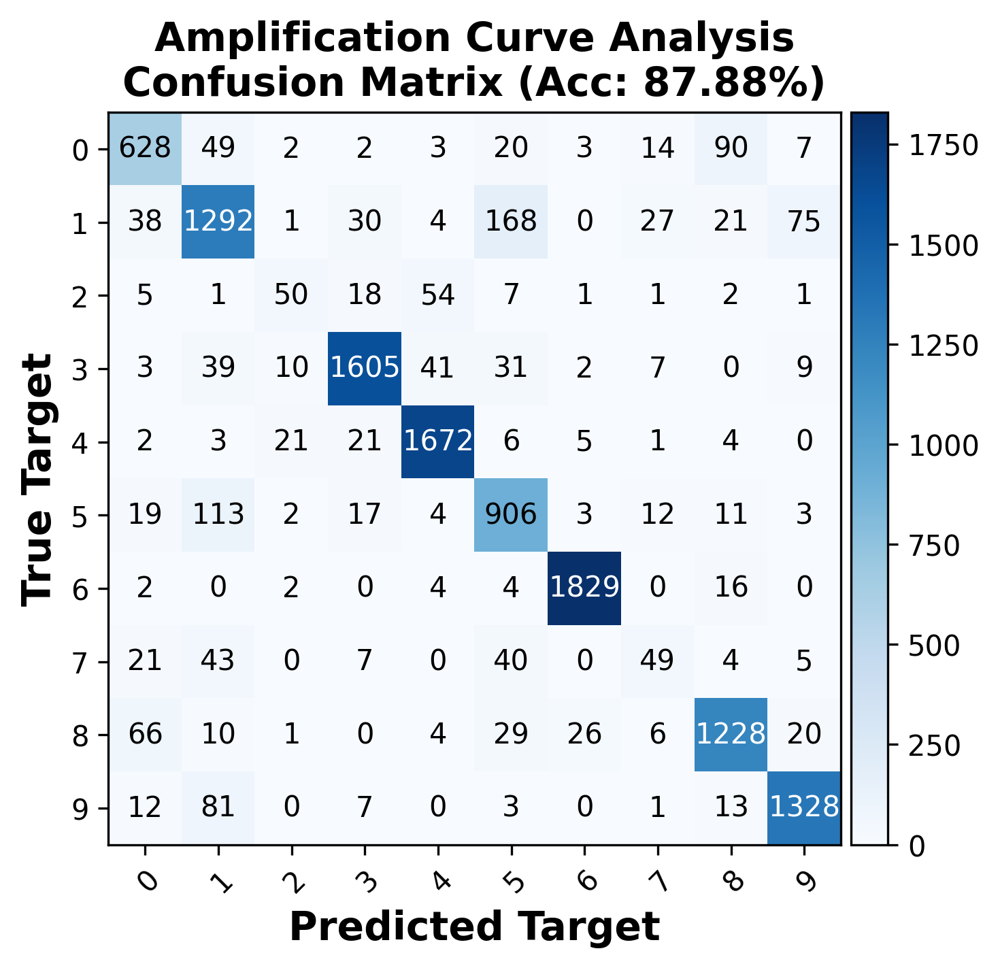

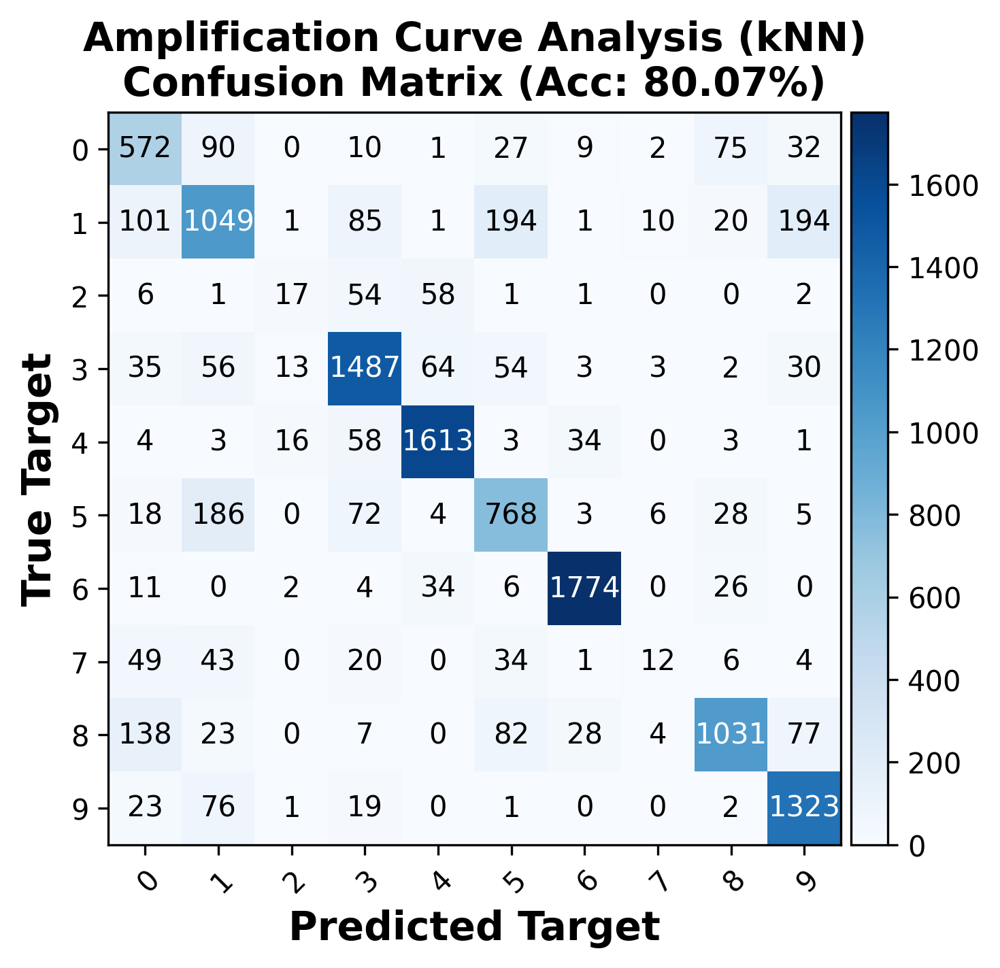

In [17]:
classes = encoder.classes_

ypreds_methods = [y_preds_FFI, y_preds_AC, y_preds_AC_kNN] #, y_preds_MC, y_preds]
titles = ['Final Fluorescence Intensity',
          'Amplification Curve Analysis',
          'Amplification Curve Analysis (kNN)']
        #   ,
        #   'Melting Curve Analysis',
        #   'Amplification and Melting Curve Analysis']
short_names = ['FFI', 'ACA_ConvNN', 'ACA_kNN'] #, 'MCA', 'AMCA']

for yp, title, short_name in zip(ypreds_methods, titles, short_names):

    fig, ax = plt.subplots(1, 1, figsize=(5, 5), dpi=300)

    utils.plot_confusion_matrix(y_trues, yp, classes, ax, normalize=False)
    ax.set_title(f'{title}\n'+ax.get_title(), fontsize=14, weight='bold')
    ax.set_ylabel('True Target', fontsize=14, weight='bold')
    ax.set_xlabel('Predicted Target', fontsize=14, weight='bold')

    plt.tight_layout()
    plt.savefig(f'Images/dPCR_{short_name}.pdf')
    plt.show()

In [18]:
clf_AC_all = myWrapper(build_fn=create_model, 
                            epochs=1000, 
                            batch_size=512, 
                            shuffle=True,
                            verbose=False)
clf_AC_all.fit(X_AC, ytrue)
y_pred = clf_AC_all.predict(X_AC) 


/Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/3. Initial code/titan-signal-processing-main/venv_titan/lib/python3.12/site-packages/scikeras/wrappers.py:925: UserWarning: ``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.
  X, y = self._initialize(X, y)


In [19]:
from sklearn.metrics import accuracy_score
print(accuracy_score(ytrue, y_pred))

0.9277828505021997


Layer 1 Weights shape: (5, 1, 16)


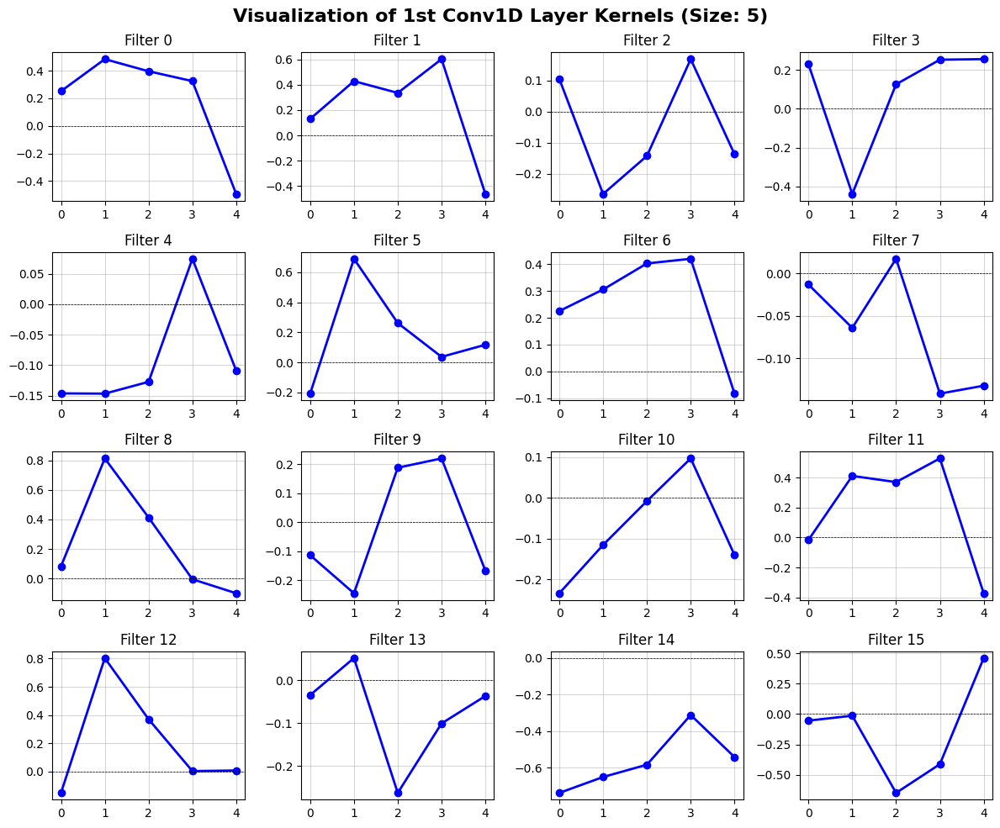

In [20]:
trained_keras_model = clf_AC_all.model_ 


conv1_layer = trained_keras_model.layers[1] 

# get_weights() returns a list: [weights_array, biases_array]
weights, biases = conv1_layer.get_weights()

print(f"Layer 1 Weights shape: {weights.shape}") # Should be (5, 1, 16)

# 3. Plot the 16 filters in a 4x4 grid
n_filters = weights.shape[2]

fig, axes = plt.subplots(4, 4, figsize=(12, 10))
fig.suptitle('Visualization of 1st Conv1D Layer Kernels (Size: 5)', fontsize=16, weight='bold')

for i, ax in enumerate(axes.flatten()):
    if i < n_filters:
        # Extract the kernel: all 5 timesteps, channel 0, filter i
        kernel_values = weights[:, 0, i] 
        
        # Plot as a line with markers
        ax.plot(kernel_values, marker='o', color='b', linewidth=2)
        ax.set_title(f'Filter {i}')
        ax.set_xticks(range(weights.shape[0]))
        ax.axhline(0, color='black', linewidth=0.5, linestyle='--') # Add a zero line
    
    ax.grid(True, alpha=0.5)

plt.tight_layout()
plt.show()

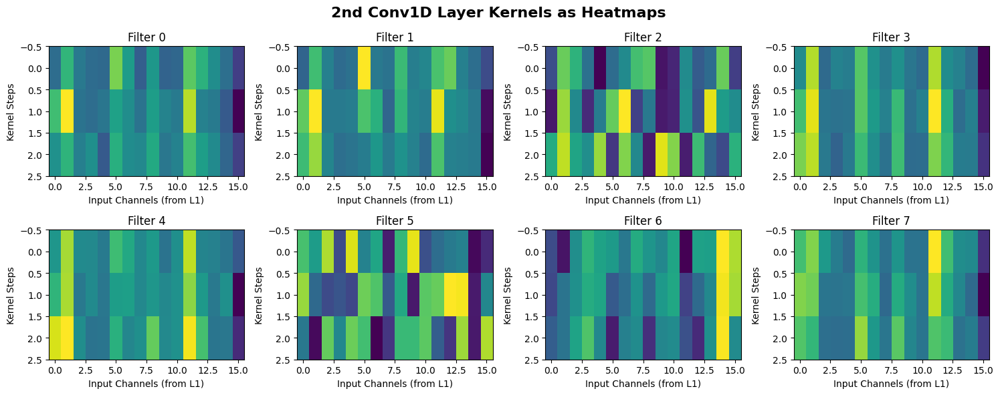

In [22]:
conv2_layer = trained_keras_model.layers[2]
weights_2, _ = conv2_layer.get_weights()
# Shape is (3, 16, 8)

fig, axes = plt.subplots(2, 4, figsize=(15, 6))
fig.suptitle('2nd Conv1D Layer Kernels as Heatmaps', fontsize=16, weight='bold')

for i, ax in enumerate(axes.flatten()):
    # Extract the 2D matrix for filter i: shape (3, 16)
    kernel_matrix = weights_2[:, :, i]
    
    cax = ax.imshow(kernel_matrix, aspect='auto', cmap='viridis')
    ax.set_title(f'Filter {i}')
    ax.set_xlabel('Input Channels (from L1)')
    ax.set_ylabel('Kernel Steps')

plt.tight_layout()
plt.show()

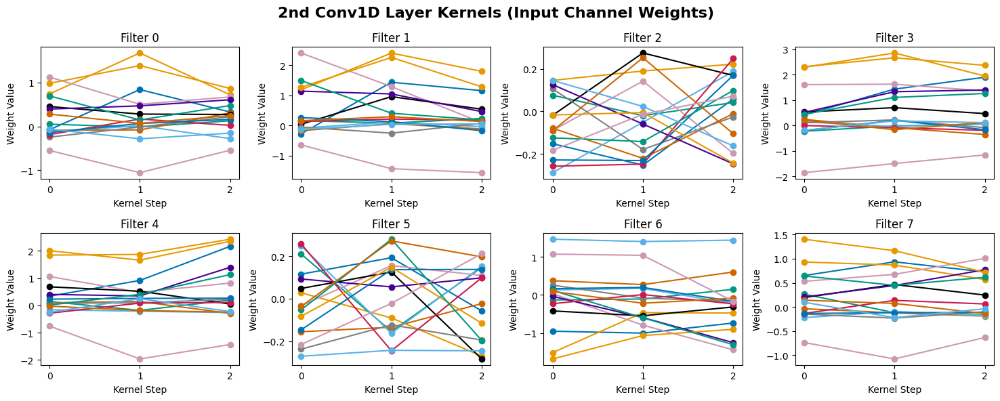

In [23]:
conv2_layer = trained_keras_model.layers[2]
weights_2, _ = conv2_layer.get_weights()

fig, axes = plt.subplots(2, 4, figsize=(15, 6))
fig.suptitle('2nd Conv1D Layer Kernels (Input Channel Weights)', fontsize=16, weight='bold')

for i, ax in enumerate(axes.flatten()):
    # Extract weights for filter i: shape (3, 16)
    # Rows are kernel steps, columns are input channels.
    filter_weights = weights_2[:, :, i]
    
    # Passing a 2D array to plot() draws one line per column (16 lines total)
    ax.plot(filter_weights, marker='o') 
    
    ax.set_title(f'Filter {i}')
    ax.set_ylabel('Weight Value')
    ax.set_xlabel('Kernel Step')
    
    # Force the x-axis to only show integer steps (0, 1, 2)
    ax.set_xticks(range(filter_weights.shape[0]))

plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
Feature map shape: (1, 611, 16)


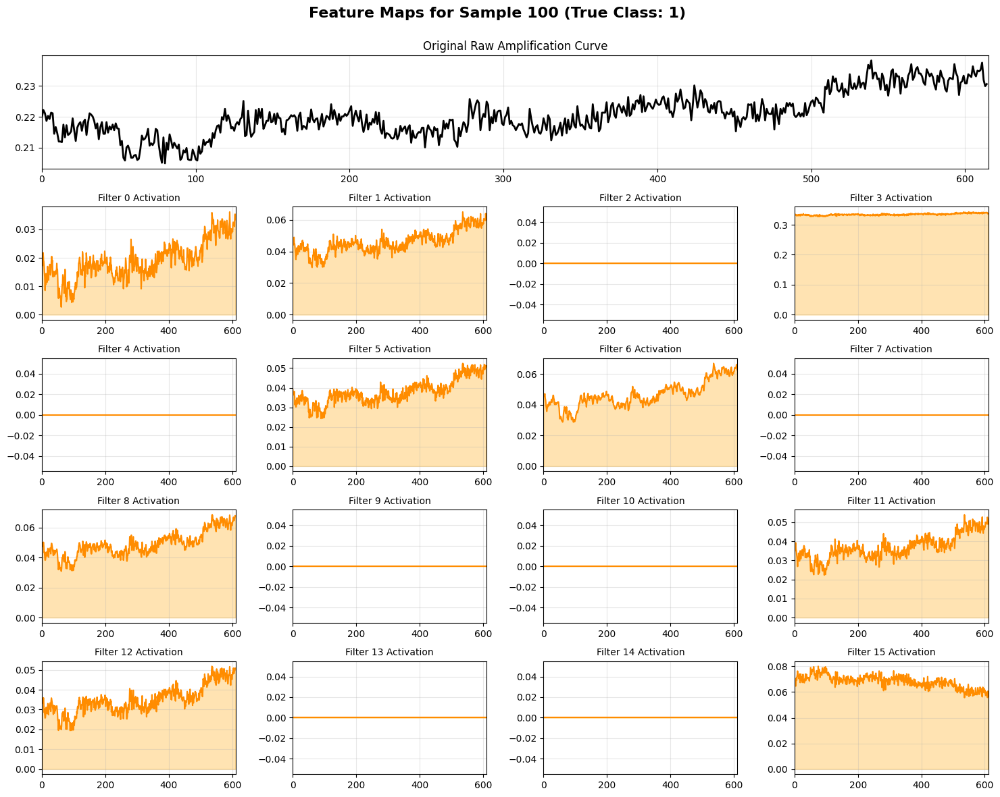

In [25]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

# 1. Access the trained Keras model
trained_keras_model = clf_AC_all.model_
classes = encoder.classes_

# 2. Create a "Feature Extractor" model
# We tell it to use the exact same input as your main model, 
# but we set the outputs to be the activations of the first Conv1D layer.
layer_name = trained_keras_model.layers[1].name # Gets the name of the first Conv1D
extractor = tf.keras.models.Model(inputs=trained_keras_model.inputs, 
                                  outputs=trained_keras_model.layers[1].output)

# 3. Pick a single Amplification Curve from your test set to visualize
# We use [0:1] instead of [0] to keep the batch dimension: shape becomes (1, timesteps, 1)
kfolds = StratifiedKFold(n_splits=10, shuffle=True, random_state=0)
splits = kfolds.split(X_AC, ytrue)

for (a, test_index) in splits:
    test_index

sample_index = 100 
single_sample = X_AC[sample_index:sample_index+1] 
true_label = ytrue[test_index][sample_index] # Assuming this matches your loop variables

# 4. Generate the feature maps
# This passes the single curve through the first layer
feature_maps = extractor.predict(single_sample)

# The output shape will be (1, new_timesteps, 16)
print(f"Feature map shape: {feature_maps.shape}") 

# 5. Plot the original curve and the 16 resulting feature maps
fig = plt.figure(figsize=(15, 12))
fig.suptitle(f'Feature Maps for Sample {sample_index} (True Class: {classes[true_label]})', 
             fontsize=16, weight='bold')

# Plot Original Signal at the top
ax_orig = plt.subplot2grid((5, 4), (0, 0), colspan=4)
ax_orig.plot(single_sample.flatten(), color='black', linewidth=2)
ax_orig.set_title('Original Raw Amplification Curve')
ax_orig.set_xlim(0, single_sample.shape[1])
ax_orig.grid(alpha=0.3)

# Plot the 16 Feature Maps below it
for i in range(16):
    ax = plt.subplot2grid((5, 4), (i // 4 + 1, i % 4))
    
    # Extract the 1D signal for filter i
    fmap_signal = feature_maps[0, :, i]
    
    # We use a different color to distinguish it from the raw input
    ax.plot(fmap_signal, color='darkorange')
    ax.set_title(f'Filter {i} Activation', fontsize=10)
    ax.set_xlim(0, feature_maps.shape[1])
    ax.grid(alpha=0.3)
    
    # Optional: Fill the area under the curve to make strong activations pop out
    ax.fill_between(range(len(fmap_signal)), fmap_signal, color='orange', alpha=0.3)

plt.tight_layout()
plt.subplots_adjust(top=0.92) # Leave room for the main title
plt.show()

Calculating prediction probabilities to find the best samples...


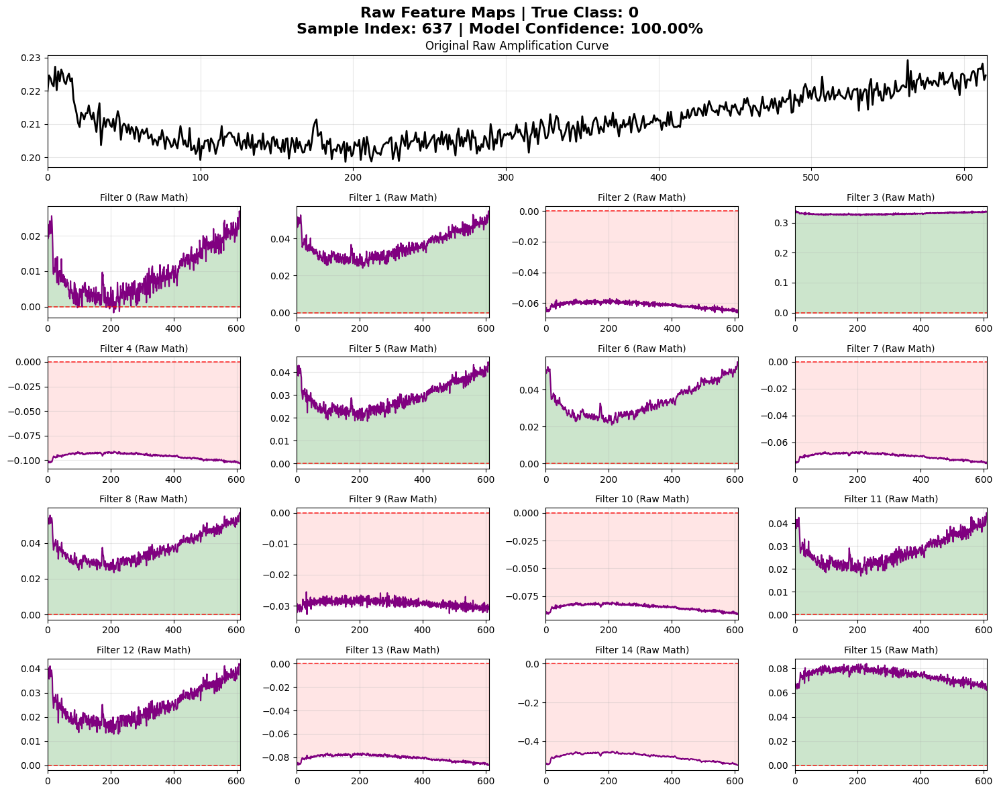

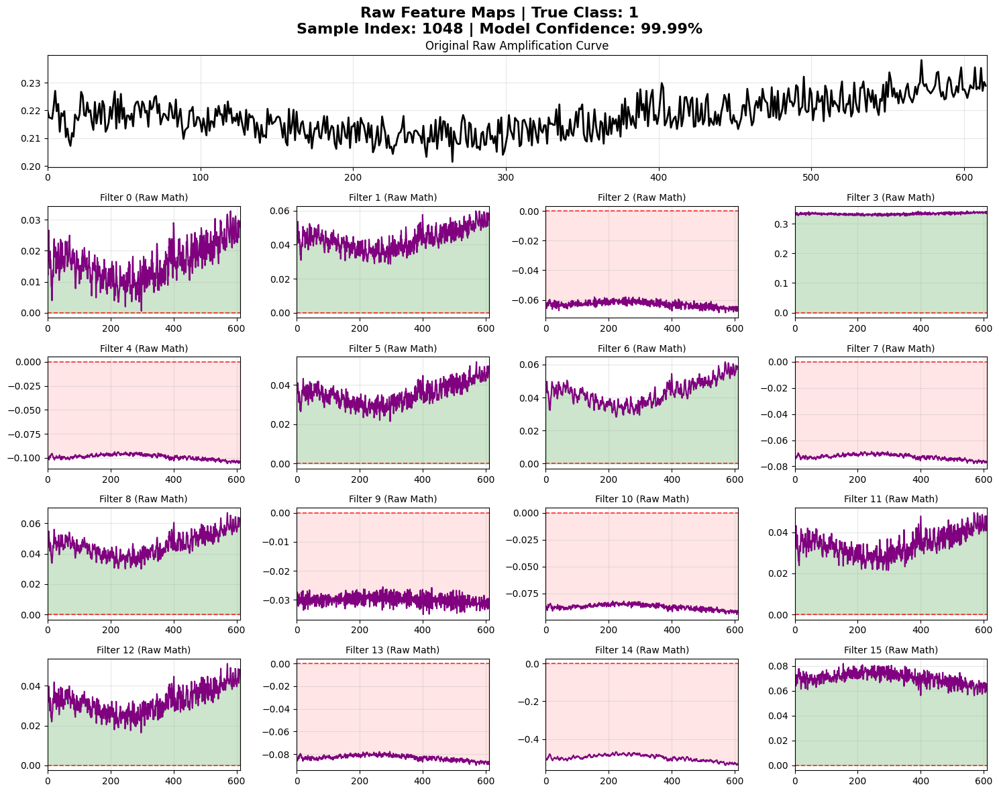

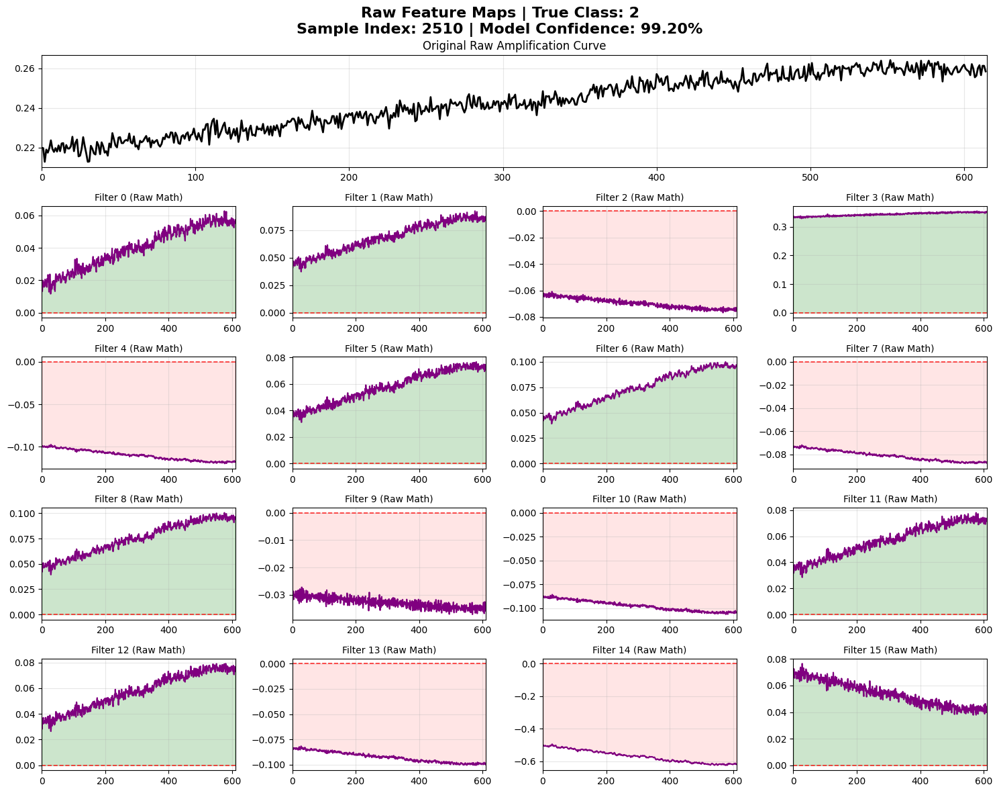

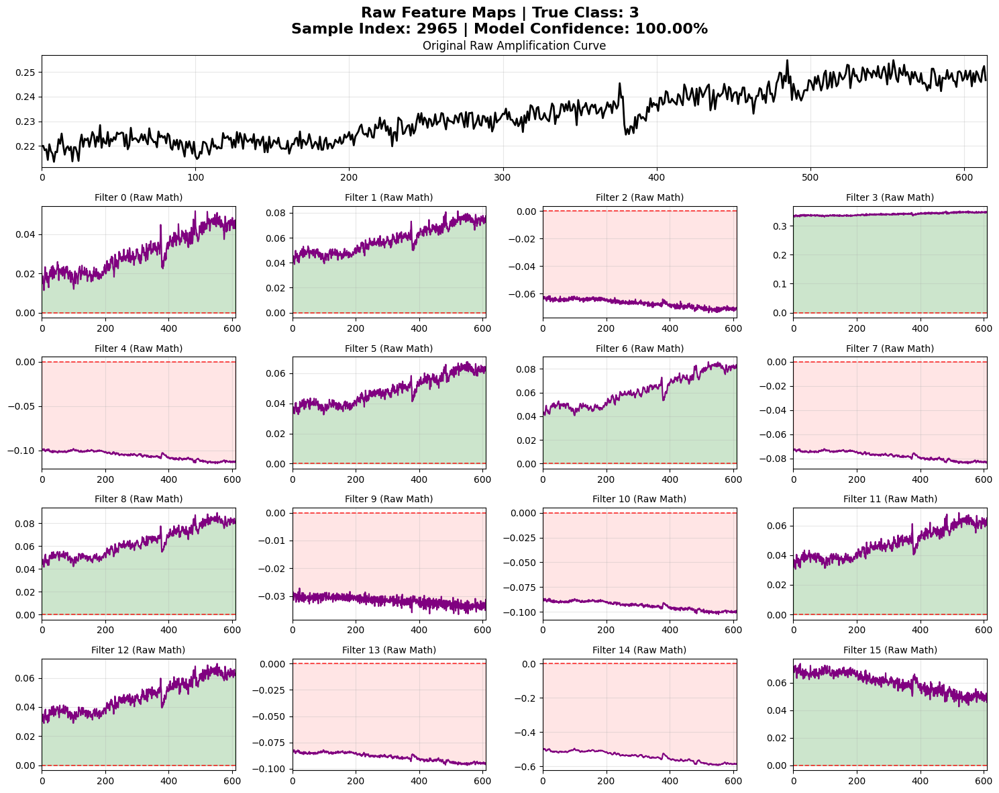

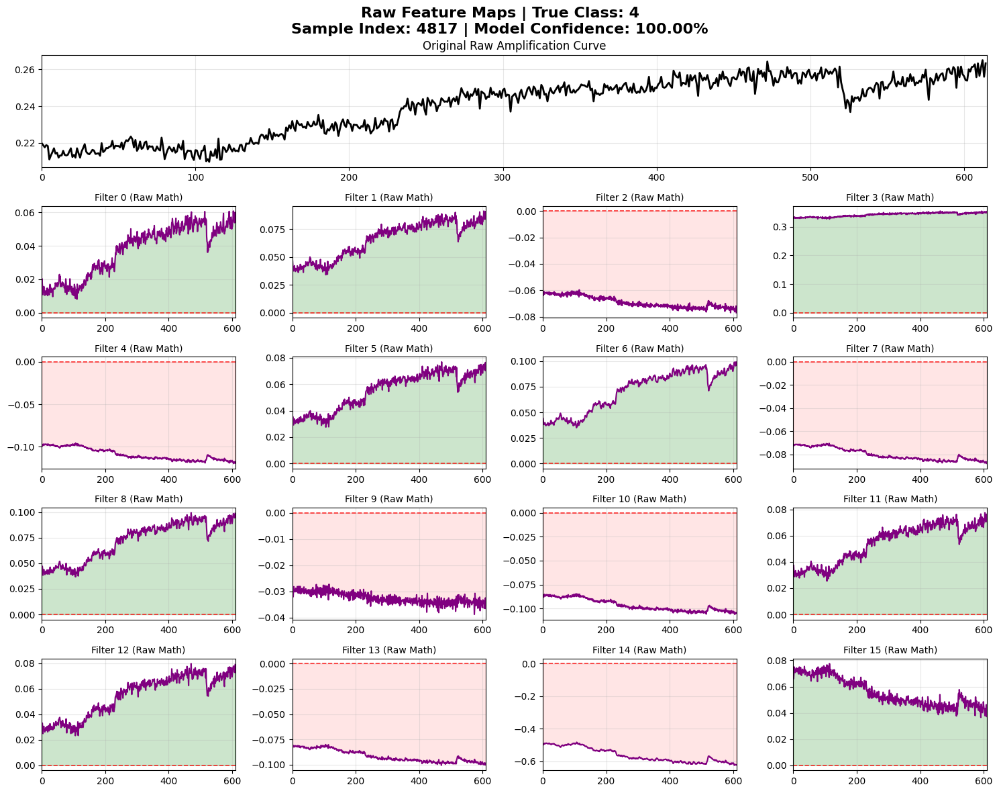

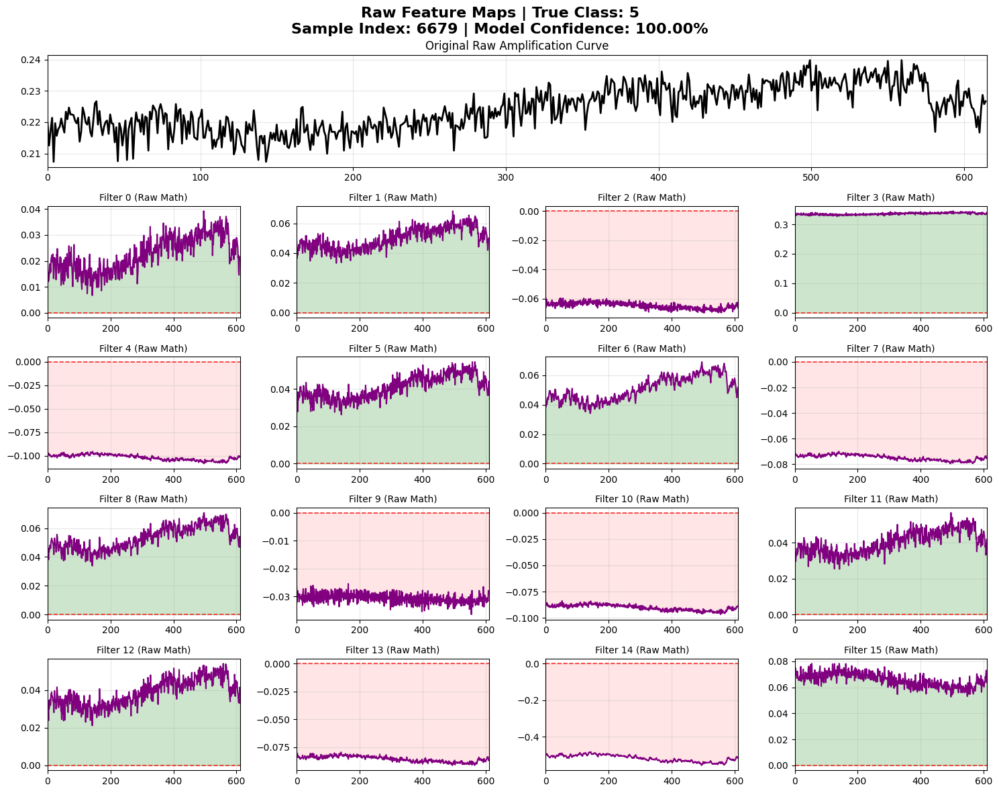

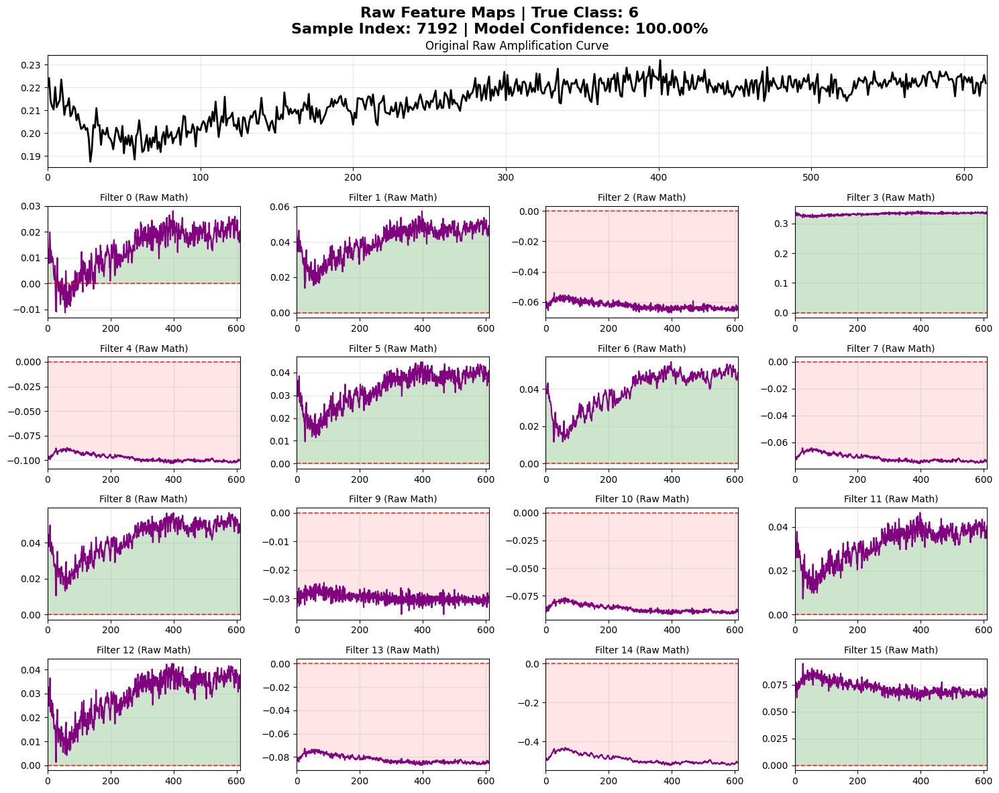

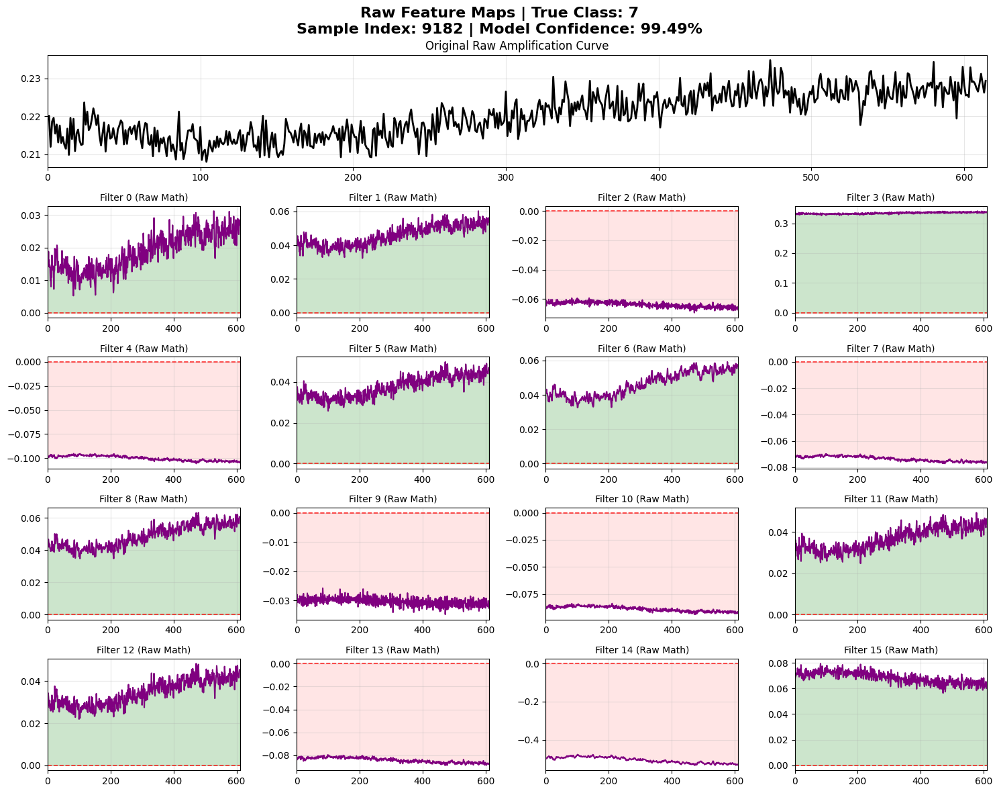

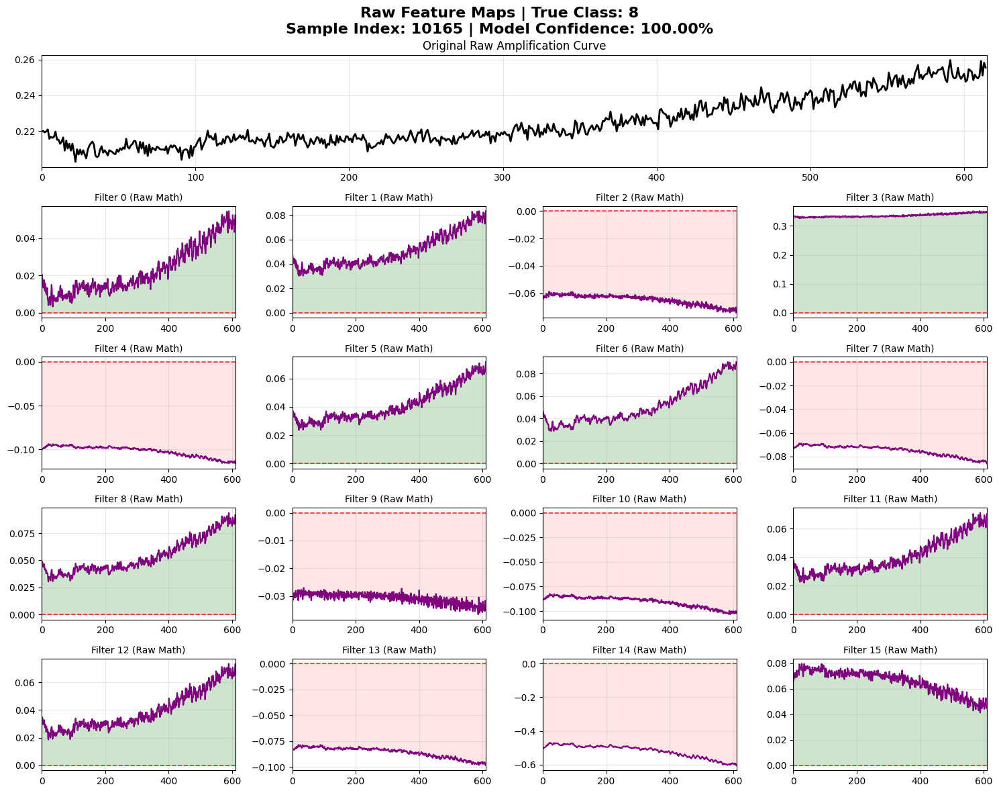

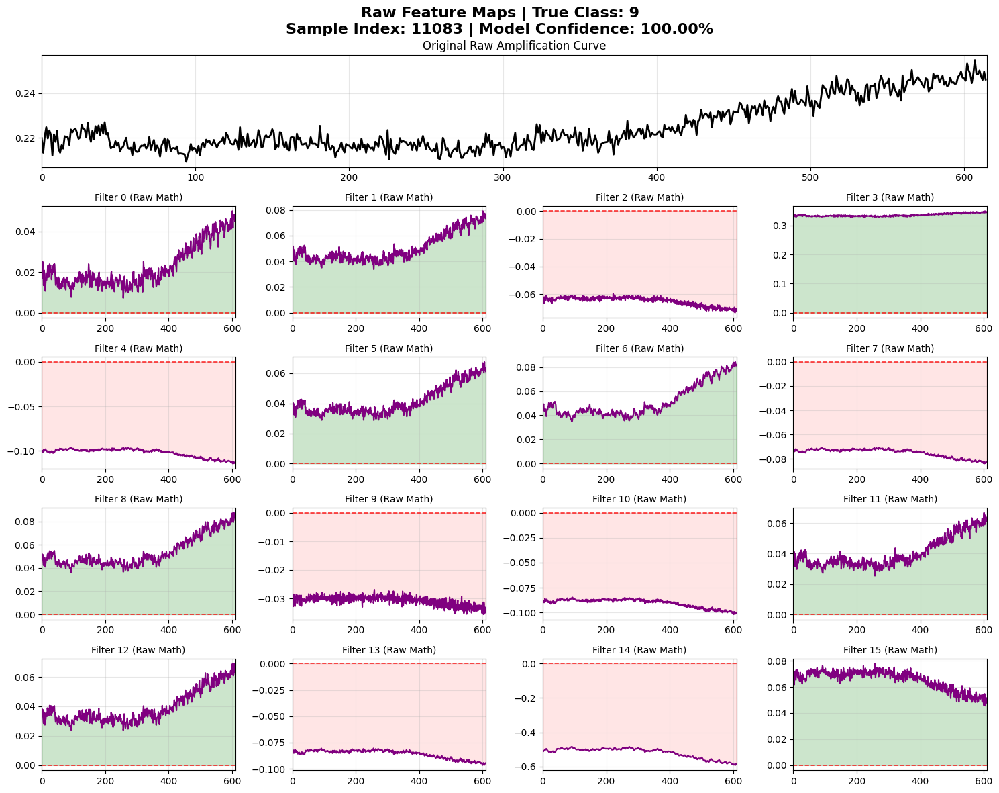

In [26]:
import matplotlib.pyplot as plt
import numpy as np

def visualize_best_feature_maps(model_wrapper, X, y_true, class_names):
    """
    Finds the most confidently predicted sample for each class and plots 
    the raw (pre-activation) feature maps from the first Conv1D layer.
    """
    # 1. Access the trained Keras model and get weights
    trained_keras_model = model_wrapper.model_
    weights, biases = trained_keras_model.layers[1].get_weights()
    n_filters = weights.shape[2]
    
    # 2. Get prediction probabilities for the entire dataset
    print("Calculating prediction probabilities to find the best samples...")
    y_probs = model_wrapper.predict_proba(X)
    
    # 3. Iterate through each unique class
    unique_classes = np.unique(y_true)
    
    for cls_idx in unique_classes:
        # Find all indices where the true label matches the current class
        true_indices = np.where(y_true == cls_idx)[0]
        
        if len(true_indices) == 0:
            continue
            
        # 4. Find the sample with the highest probability for this specific class
        class_probs = y_probs[true_indices, cls_idx]
        best_local_idx = np.argmax(class_probs)
        best_global_idx = true_indices[best_local_idx]
        best_confidence = class_probs[best_local_idx]
        
        class_name = class_names[cls_idx]
        single_sample_1d = X[best_global_idx].flatten()
        
        # 5. Prepare the main plot for this class
        fig = plt.figure(figsize=(15, 12))
        fig.suptitle(f'Raw Feature Maps | True Class: {class_name}\n'
                     f'Sample Index: {best_global_idx} | Model Confidence: {best_confidence*100:.2f}%', 
                     fontsize=16, weight='bold')

        # Plot Original Signal at the top
        ax_orig = plt.subplot2grid((5, 4), (0, 0), colspan=4)
        ax_orig.plot(single_sample_1d, color='black', linewidth=2)
        ax_orig.set_title('Original Raw Amplification Curve')
        ax_orig.set_xlim(0, len(single_sample_1d))
        ax_orig.grid(alpha=0.3)

        # 6. Manually calculate and plot the 16 raw Feature Maps
        for i in range(n_filters):
            ax = plt.subplot2grid((5, 4), (i // 4 + 1, i % 4))
            
            kernel = weights[:, 0, i]
            bias = biases[i]
            
            # MANUALLY perform 1D Convolution (Cross-Correlation)
            raw_fmap_signal = np.correlate(single_sample_1d, kernel, mode='valid') + bias
            
            # Plot the raw pre-activation signal
            ax.plot(raw_fmap_signal, color='purple', linewidth=1.5)
            
            # Add a red dashed line at zero 
            ax.axhline(0, color='red', linestyle='--', linewidth=1.2, alpha=0.8)
            
            # Fill the positive (kept) and negative (crushed) areas
            ax.fill_between(range(len(raw_fmap_signal)), raw_fmap_signal, 0, 
                            where=(raw_fmap_signal > 0), color='green', alpha=0.2)
            ax.fill_between(range(len(raw_fmap_signal)), raw_fmap_signal, 0, 
                            where=(raw_fmap_signal < 0), color='red', alpha=0.1)
            
            ax.set_title(f'Filter {i} (Raw Math)', fontsize=10)
            ax.set_xlim(0, len(raw_fmap_signal))
            ax.grid(alpha=0.3)

        plt.tight_layout()
        plt.subplots_adjust(top=0.92)
        plt.show()

# ==========================================
# How to call the function:
# ==========================================
# Assuming clf_AC_all is trained, and X_AC, ytrue, and classes are available:

visualize_best_feature_maps(
    model_wrapper=clf_AC_all, 
    X=X_AC, 
    y_true=ytrue, 
    class_names=classes
)

Calculating prediction probabilities...


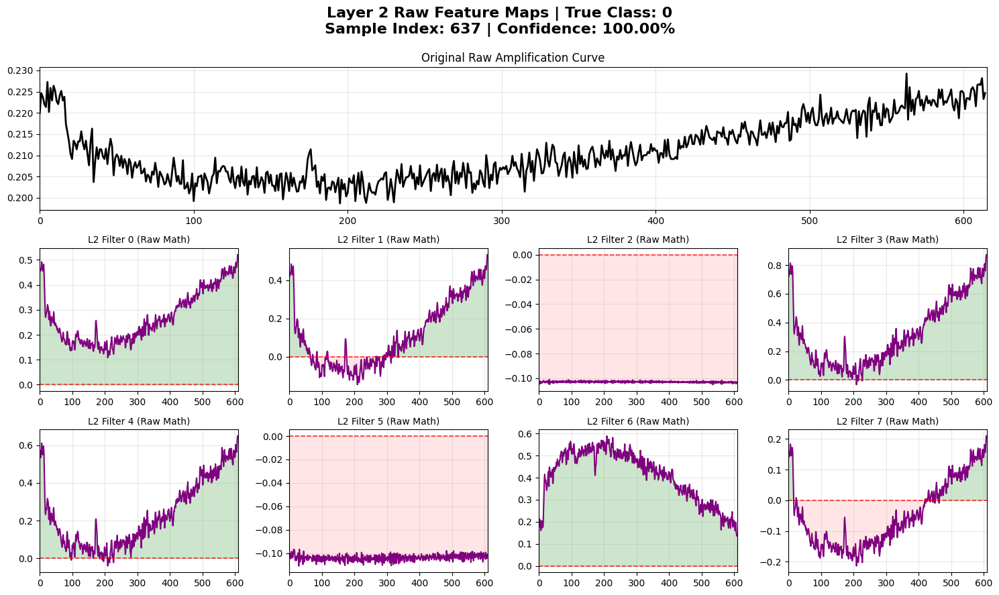

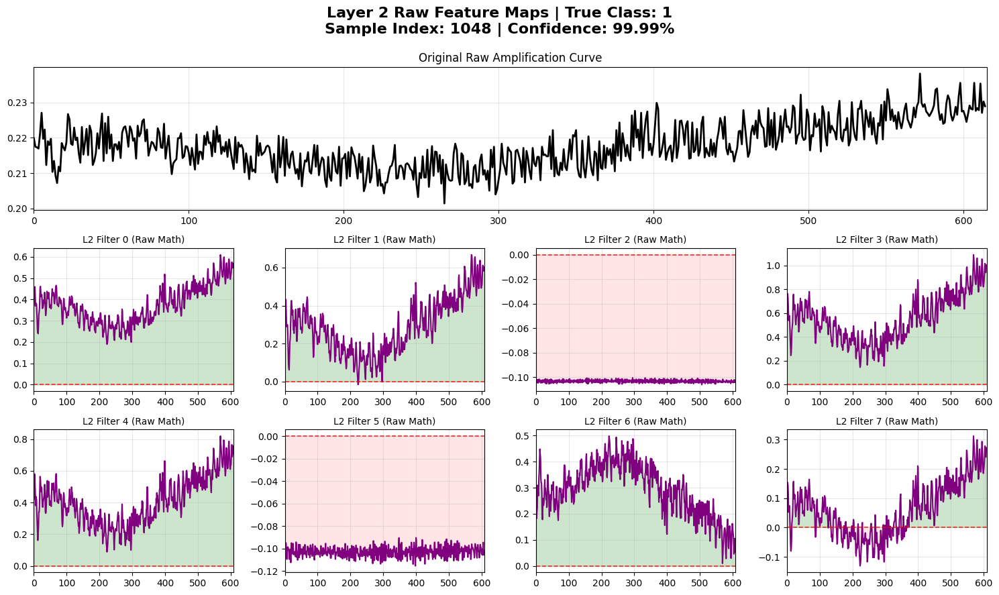

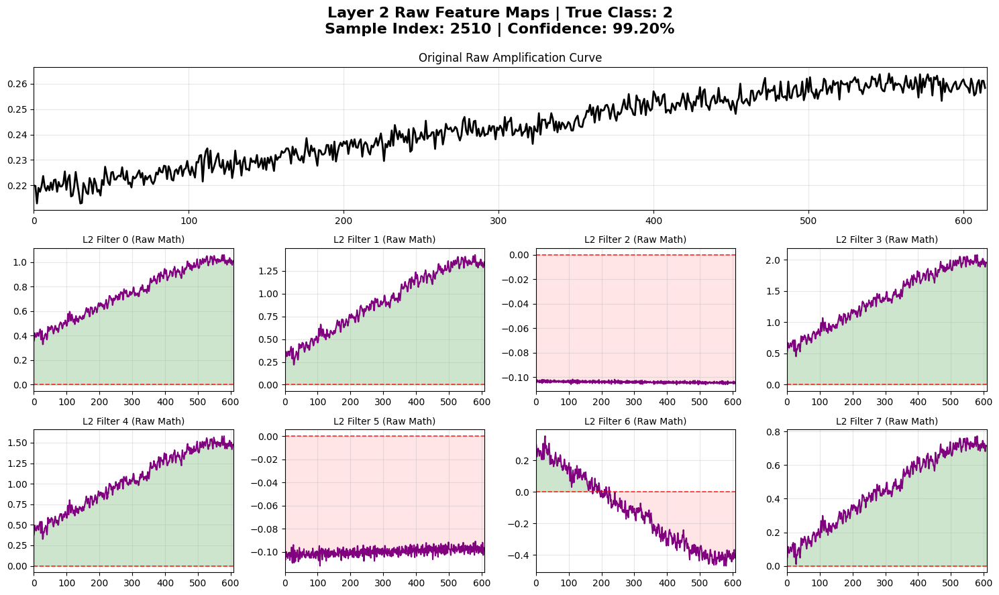

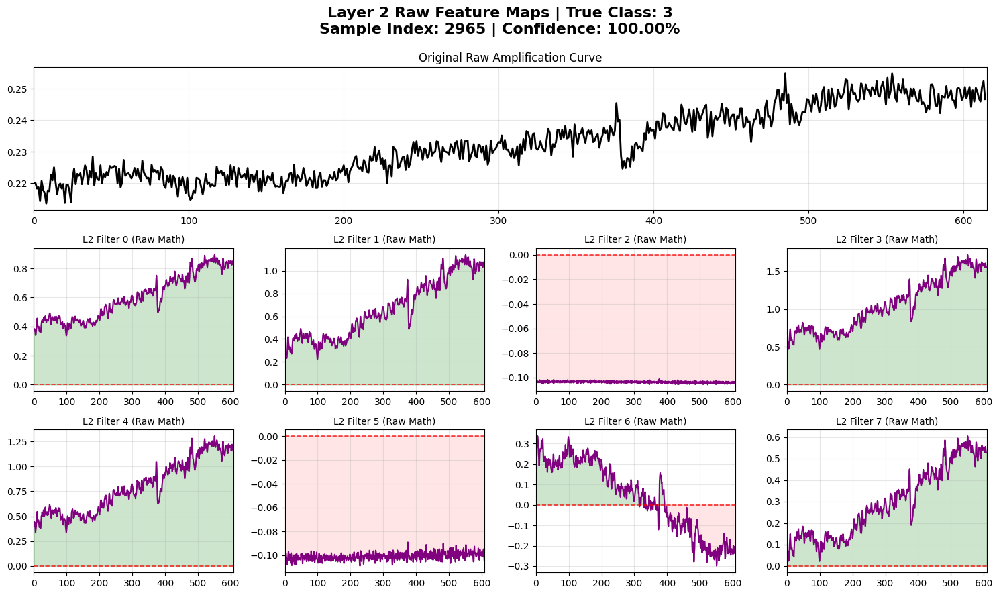

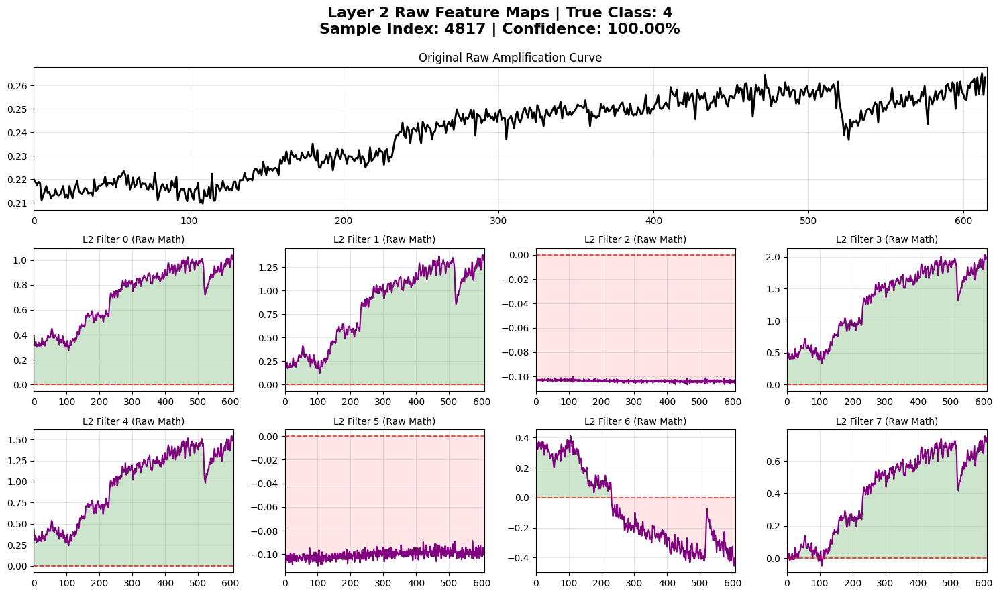

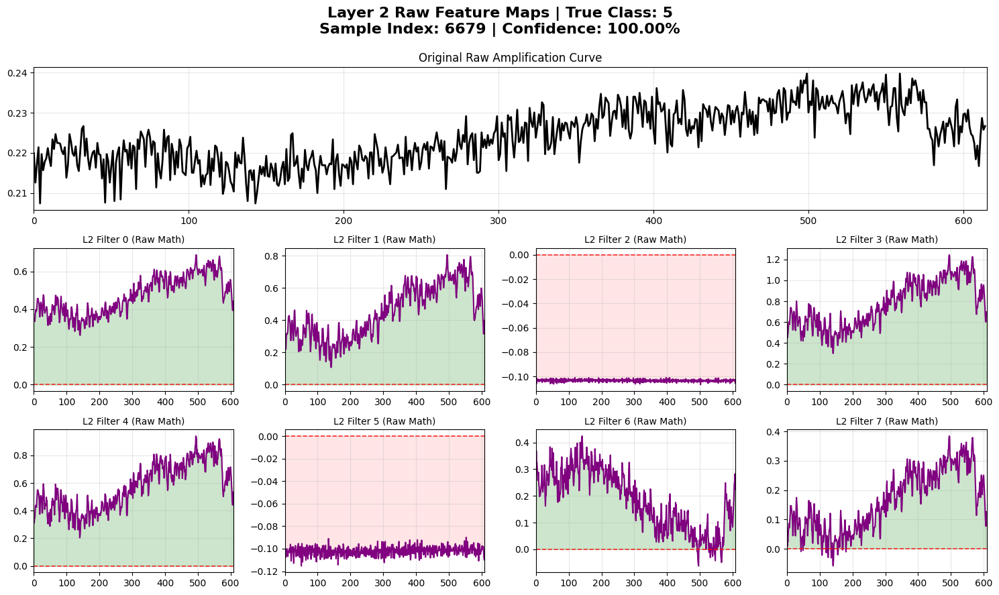

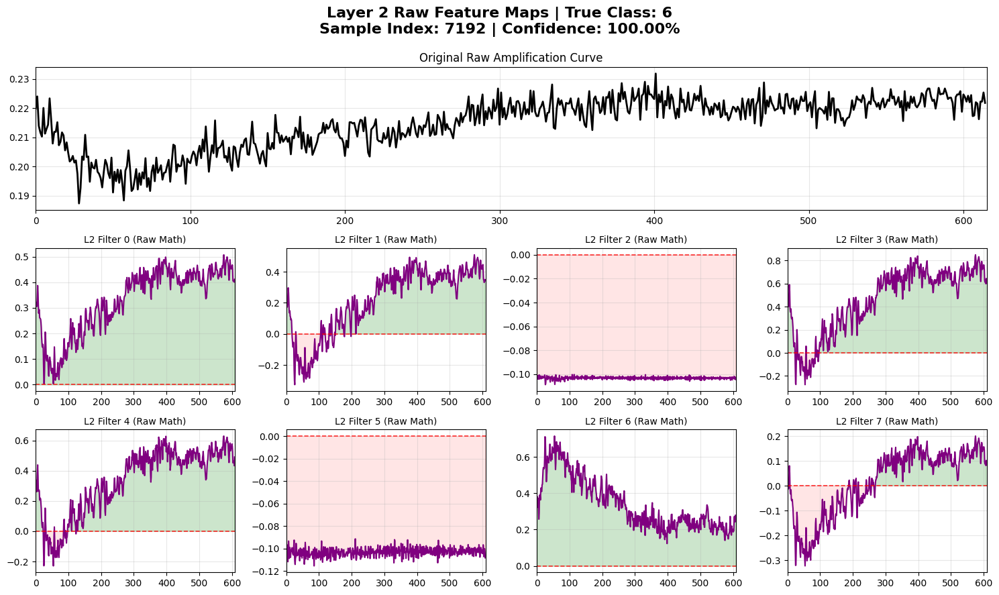

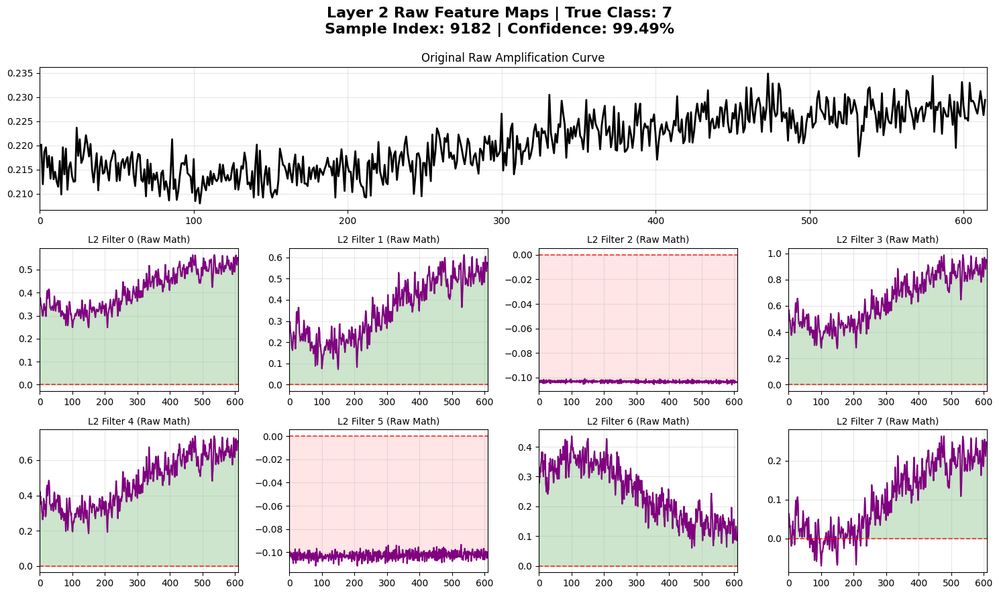

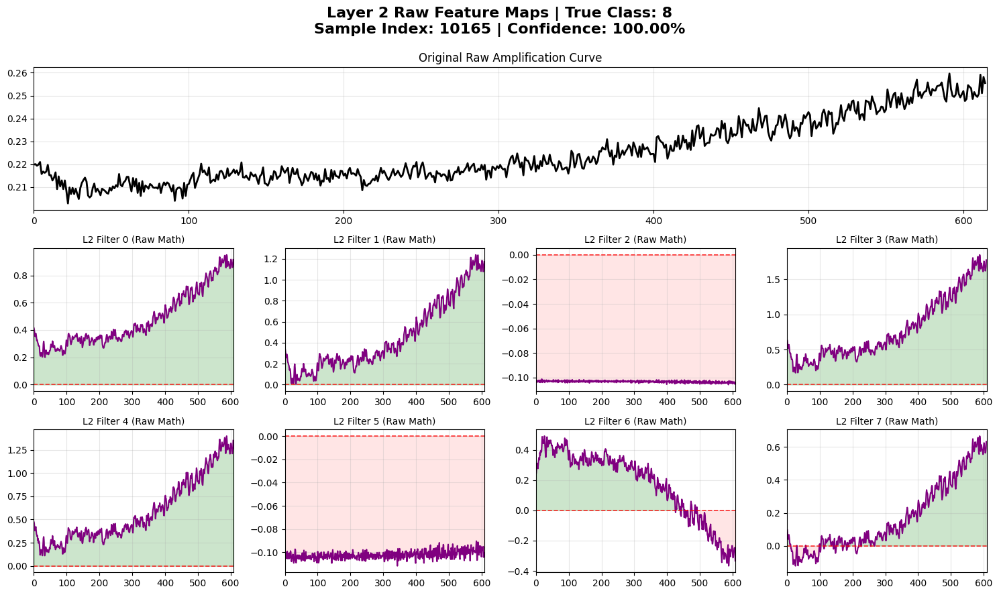

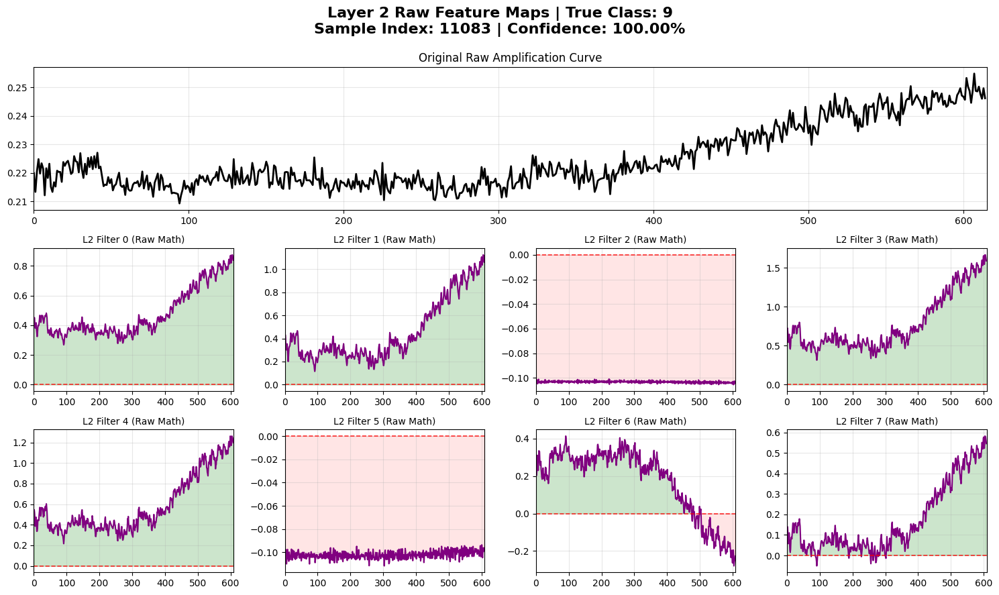

In [27]:
import matplotlib.pyplot as plt
import numpy as np

def visualize_layer2_feature_maps(model_wrapper, X, y_true, class_names):
    """
    Finds the most confidently predicted sample for each class and plots 
    the raw (pre-activation) feature maps from the SECOND Conv1D layer.
    """
    trained_model = model_wrapper.model_
    
    # 1. Get weights for BOTH layers
    w1, b1 = trained_model.layers[1].get_weights() # Shape: (5, 1, 16)
    w2, b2 = trained_model.layers[2].get_weights() # Shape: (3, 16, 8)
    
    n_l1_filters = w1.shape[2]
    n_l2_filters = w2.shape[2] # This is 8
    
    print("Calculating prediction probabilities...")
    y_probs = model_wrapper.predict_proba(X)
    unique_classes = np.unique(y_true)
    
    for cls_idx in unique_classes:
        true_indices = np.where(y_true == cls_idx)[0]
        if len(true_indices) == 0:
            continue
            
        # 2. Find the best sample
        class_probs = y_probs[true_indices, cls_idx]
        best_local_idx = np.argmax(class_probs)
        best_global_idx = true_indices[best_local_idx]
        best_confidence = class_probs[best_local_idx]
        
        class_name = class_names[cls_idx]
        single_sample_1d = X[best_global_idx].flatten()
        
        # =========================================================
        # 3. MANUALLY COMPUTE LAYER 1 (And apply ReLU)
        # =========================================================
        l1_length = len(single_sample_1d) - w1.shape[0] + 1
        l1_post_relu = np.zeros((l1_length, n_l1_filters))
        
        for f1 in range(n_l1_filters):
            kernel1 = w1[:, 0, f1]
            raw_l1 = np.correlate(single_sample_1d, kernel1, mode='valid') + b1[f1]
            # Must apply ReLU here, because Layer 2 expects activated inputs!
            l1_post_relu[:, f1] = np.maximum(0, raw_l1) 
            
        # =========================================================
        # 4. MANUALLY COMPUTE LAYER 2 (Pre-Activation)
        # =========================================================
        l2_length = l1_length - w2.shape[0] + 1
        
        fig = plt.figure(figsize=(15, 9))
        fig.suptitle(f'Layer 2 Raw Feature Maps | True Class: {class_name}\n'
                     f'Sample Index: {best_global_idx} | Confidence: {best_confidence*100:.2f}%', 
                     fontsize=16, weight='bold')

        # Plot Original Signal at the top for reference
        ax_orig = plt.subplot2grid((3, 4), (0, 0), colspan=4)
        ax_orig.plot(single_sample_1d, color='black', linewidth=2)
        ax_orig.set_title('Original Raw Amplification Curve')
        ax_orig.set_xlim(0, len(single_sample_1d))
        ax_orig.grid(alpha=0.3)

        # Plot the 8 Layer 2 Feature Maps
        for f2 in range(n_l2_filters):
            ax = plt.subplot2grid((3, 4), (f2 // 4 + 1, f2 % 4))
            
            raw_l2_fmap = np.zeros(l2_length)
            
            # The Multi-Channel Convolution: Summing across all 16 Layer 1 outputs
            for c in range(n_l1_filters):
                kernel2_channel = w2[:, c, f2]
                raw_l2_fmap += np.correlate(l1_post_relu[:, c], kernel2_channel, mode='valid')
            
            # Add Layer 2 bias once per filter
            raw_l2_fmap += b2[f2]
            
            # Plotting
            ax.plot(raw_l2_fmap, color='purple', linewidth=1.5)
            ax.axhline(0, color='red', linestyle='--', linewidth=1.2, alpha=0.8)
            ax.fill_between(range(len(raw_l2_fmap)), raw_l2_fmap, 0, 
                            where=(raw_l2_fmap > 0), color='green', alpha=0.2)
            ax.fill_between(range(len(raw_l2_fmap)), raw_l2_fmap, 0, 
                            where=(raw_l2_fmap < 0), color='red', alpha=0.1)
            
            ax.set_title(f'L2 Filter {f2} (Raw Math)', fontsize=10)
            ax.set_xlim(0, len(raw_l2_fmap))
            ax.grid(alpha=0.3)

        plt.tight_layout()
        plt.subplots_adjust(top=0.88)
        plt.show()

# Run the function
visualize_layer2_feature_maps(clf_AC_all, X_AC, ytrue, classes)

In [28]:
import matplotlib.pyplot as plt
import numpy as np

def visualize_feature_maps_grid(model_wrapper, X, y_true, class_names):
    """
    Creates a grid visualization where columns represent the best sample for each class,
    Row 0 is the original curve, and Rows 1-N are the raw feature maps for each filter.
    """
    # 1. Access the trained Keras model and get weights
    trained_keras_model = model_wrapper.model_
    weights, biases = trained_keras_model.layers[1].get_weights()
    n_filters = weights.shape[2]
    
    print("Calculating prediction probabilities to find the best samples...")
    y_probs = model_wrapper.predict_proba(X)
    
    unique_classes = np.unique(y_true)
    n_classes = len(unique_classes)
    
    # Dictionary to store the best sample index and confidence for each class
    best_samples = {}
    for cls_idx in unique_classes:
        true_indices = np.where(y_true == cls_idx)[0]
        if len(true_indices) == 0:
            continue
            
        class_probs = y_probs[true_indices, cls_idx]
        best_local_idx = np.argmax(class_probs)
        best_global_idx = true_indices[best_local_idx]
        best_confidence = class_probs[best_local_idx]
        
        best_samples[cls_idx] = (best_global_idx, best_confidence)

    # 2. Setup the grid layout
    nrows = n_filters + 1  # 1 row for original curve + 1 for each filter
    ncols = len(best_samples)
    
    # Make the figure dynamically scale based on classes and filters
    # squeeze=False ensures 'axes' is always a 2D array, even if there's only 1 class
    fig, axes = plt.subplots(nrows, ncols, figsize=(4.5 * ncols, 1.8 * nrows), squeeze=False)
    fig.suptitle('Raw Feature Maps Comparison Across Classes', fontsize=20, weight='bold', y=0.99)

    # 3. Populate the grid column by column (class by class)
    for col_idx, (cls_idx, (best_global_idx, conf)) in enumerate(best_samples.items()):
        class_name = class_names[cls_idx]
        single_sample_1d = X[best_global_idx].flatten()
        
        # --- ROW 0: Plot the Original Signal ---
        ax_orig = axes[0, col_idx]
        ax_orig.plot(single_sample_1d, color='black', linewidth=2)
        ax_orig.set_title(f'{class_name}\n(Idx: {best_global_idx} | Conf: {conf*100:.1f}%)', 
                          fontsize=14, weight='bold')
        ax_orig.set_xlim(0, len(single_sample_1d))
        ax_orig.grid(alpha=0.3)
        
        # Only label the Y-axis on the leftmost column
        if col_idx == 0:
            ax_orig.set_ylabel('Original\nCurve', fontsize=12, weight='bold')

        # --- ROWS 1 to N: Plot the Feature Maps ---
        for f_idx in range(n_filters):
            row_idx = f_idx + 1
            ax_fmap = axes[row_idx, col_idx]
            
            kernel = weights[:, 0, f_idx]
            bias = biases[f_idx]
            
            # MANUALLY perform 1D Convolution (Cross-Correlation)
            raw_fmap_signal = np.correlate(single_sample_1d, kernel, mode='valid') + bias
            
            ax_fmap.plot(raw_fmap_signal, color='purple', linewidth=1.5)
            
            # Add a red dashed line at zero 
            ax_fmap.axhline(0, color='red', linestyle='--', linewidth=1.2, alpha=0.8)
            
            # Fill the positive (kept) and negative (crushed) areas
            ax_fmap.fill_between(range(len(raw_fmap_signal)), raw_fmap_signal, 0, 
                                 where=(raw_fmap_signal > 0), color='green', alpha=0.2)
            ax_fmap.fill_between(range(len(raw_fmap_signal)), raw_fmap_signal, 0, 
                                 where=(raw_fmap_signal < 0), color='red', alpha=0.1)
            
            ax_fmap.set_xlim(0, len(raw_fmap_signal))
            ax_fmap.grid(alpha=0.3)
            
            # Label Y-axis for the leftmost column to identify the filter number
            if col_idx == 0:
                ax_fmap.set_ylabel(f'Filter {f_idx}', fontsize=12, weight='bold')

    plt.tight_layout()
    # Adjust spacing so the main title doesn't overlap the column titles
    plt.subplots_adjust(top=0.96, hspace=0.3) 
    plt.show()

# ==========================================
# How to call the function:
# ==========================================
# visualize_feature_maps_grid(clf_AC_all, X_AC, ytrue, classes)

Calculating prediction probabilities to find the best samples...


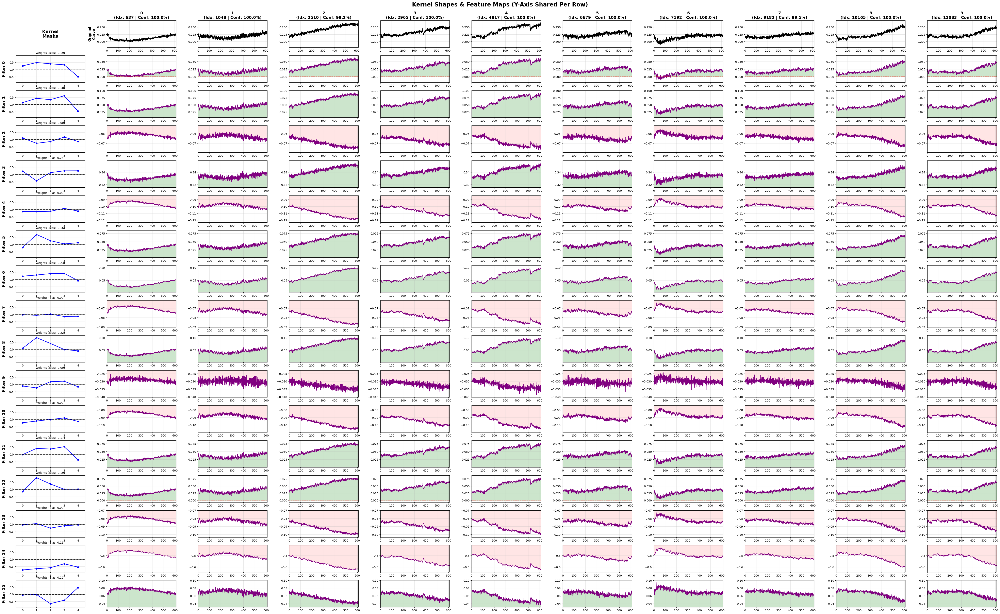

In [29]:
import matplotlib.pyplot as plt
import numpy as np

def visualize_feature_maps_per_kernel_axes(model_wrapper, X, y_true, class_names):
    """
    Creates a grid visualization with specifically targeted shared axes:
    - Kernel masks share their own X and Y limits.
    - Original curves share their own X and Y limits.
    - Feature maps share the same X axis length.
    - Feature maps share the Y axis PER KERNEL (Row-based sharing).
    """
    # 1. Access the trained Keras model and get weights
    trained_keras_model = model_wrapper.model_
    weights, biases = trained_keras_model.layers[1].get_weights()
    n_filters = weights.shape[2]
    kernel_size = weights.shape[0]
    
    print("Calculating prediction probabilities to find the best samples...")
    y_probs = model_wrapper.predict_proba(X)
    
    unique_classes = np.unique(y_true)
    
    # Dictionary to store the best sample index and confidence for each class
    best_samples = {}
    for cls_idx in unique_classes:
        true_indices = np.where(y_true == cls_idx)[0]
        if len(true_indices) == 0:
            continue
            
        class_probs = y_probs[true_indices, cls_idx]
        best_local_idx = np.argmax(class_probs)
        best_global_idx = true_indices[best_local_idx]
        best_confidence = class_probs[best_local_idx]
        
        best_samples[cls_idx] = (best_global_idx, best_confidence)

    # ==========================================
    # 2. Pre-calculate Limits for Shared Axes
    # ==========================================
    # Limits for Kernels
    k_min, k_max = weights.min(), weights.max()
    k_margin = (k_max - k_min) * 0.1 if k_max != k_min else 0.1
    
    orig_min, orig_max = float('inf'), float('-inf')
    
    # Arrays to track the min and max for EACH filter independently
    fmap_mins = np.full(n_filters, float('inf'))
    fmap_maxs = np.full(n_filters, float('-inf'))
    
    # Run through to find limits
    for cls_idx, (best_global_idx, _) in best_samples.items():
        sample = X[best_global_idx].flatten()
        orig_min = min(orig_min, sample.min())
        orig_max = max(orig_max, sample.max())
        
        for f_idx in range(n_filters):
            kernel = weights[:, 0, f_idx]
            bias = biases[f_idx]
            fmap = np.correlate(sample, kernel, mode='valid') + bias
            
            # Update the specific min/max for this individual filter
            fmap_mins[f_idx] = min(fmap_mins[f_idx], fmap.min())
            fmap_maxs[f_idx] = max(fmap_maxs[f_idx], fmap.max())
            
    o_margin = (orig_max - orig_min) * 0.1 if orig_max != orig_min else 0.1
    
    # Calculate margins for each filter
    f_margins = [(max_val - min_val) * 0.1 if max_val != min_val else 0.1 
                 for min_val, max_val in zip(fmap_mins, fmap_maxs)]

    # Lengths for X-axes
    orig_length = len(X[list(best_samples.values())[0][0]].flatten())
    fmap_length = orig_length - kernel_size + 1

    # ==========================================
    # 3. Setup the Grid Layout
    # ==========================================
    nrows = n_filters + 1 
    ncols = len(best_samples) + 1 
    
    fig, axes = plt.subplots(nrows, ncols, figsize=(4.5 * ncols, 1.8 * nrows), squeeze=False)
    fig.suptitle('Kernel Shapes & Feature Maps (Y-Axis Shared Per Row)', fontsize=20, weight='bold', y=0.99)

    # ==========================================
    # COLUMN 0: Plot the Kernel Masks
    # ==========================================
    axes[0, 0].axis('off')
    axes[0, 0].text(0.5, 0.5, 'Kernel\nMasks', ha='center', va='center', fontsize=16, weight='bold')

    for f_idx in range(n_filters):
        row_idx = f_idx + 1
        ax_kernel = axes[row_idx, 0]
        
        kernel = weights[:, 0, f_idx]
        
        ax_kernel.plot(kernel, marker='o', color='blue', linewidth=2, markersize=5)
        ax_kernel.axhline(0, color='black', linestyle='--', linewidth=1)
        ax_kernel.set_title(f'Weights (Bias: {biases[f_idx]:.2f})', fontsize=10)
        ax_kernel.set_ylabel(f'Filter {f_idx}', fontsize=14, weight='bold')
        
        # Shared axes for kernels
        ax_kernel.set_xlim(-0.5, kernel_size - 0.5)
        ax_kernel.set_ylim(k_min - k_margin, k_max + k_margin)
        ax_kernel.set_xticks(range(kernel_size))
        ax_kernel.grid(alpha=0.3)

    # ==========================================
    # COLUMNS 1 to N: Plot the Classes
    # ==========================================
    for c_idx, (cls_idx, (best_global_idx, conf)) in enumerate(best_samples.items()):
        col_idx = c_idx + 1
        
        class_name = class_names[cls_idx]
        single_sample_1d = X[best_global_idx].flatten()
        
        # --- ROW 0: Plot the Original Signal ---
        ax_orig = axes[0, col_idx]
        ax_orig.plot(single_sample_1d, color='black', linewidth=2)
        ax_orig.set_title(f'{class_name}\n(Idx: {best_global_idx} | Conf: {conf*100:.1f}%)', 
                          fontsize=14, weight='bold')
        
        # Shared axes for original curves
        ax_orig.set_xlim(0, orig_length - 1)
        ax_orig.set_ylim(orig_min - o_margin, orig_max + o_margin)
        ax_orig.grid(alpha=0.3)
        
        if col_idx == 1:
             ax_orig.set_ylabel('Original\nCurve', fontsize=12, weight='bold')

        # --- ROWS 1 to N: Plot the Feature Maps ---
        for f_idx in range(n_filters):
            row_idx = f_idx + 1
            ax_fmap = axes[row_idx, col_idx]
            
            kernel = weights[:, 0, f_idx]
            bias = biases[f_idx]
            
            raw_fmap_signal = np.correlate(single_sample_1d, kernel, mode='valid') + bias
            
            ax_fmap.plot(raw_fmap_signal, color='purple', linewidth=1.5)
            ax_fmap.axhline(0, color='red', linestyle='--', linewidth=1.2, alpha=0.8)
            
            ax_fmap.fill_between(range(len(raw_fmap_signal)), raw_fmap_signal, 0, 
                                 where=(raw_fmap_signal > 0), color='green', alpha=0.2)
            ax_fmap.fill_between(range(len(raw_fmap_signal)), raw_fmap_signal, 0, 
                                 where=(raw_fmap_signal < 0), color='red', alpha=0.1)
            
            # Apply Row-Specific (Per-Kernel) shared Y-axis
            ax_fmap.set_xlim(0, fmap_length - 1)
            ax_fmap.set_ylim(fmap_mins[f_idx] - f_margins[f_idx], fmap_maxs[f_idx] + f_margins[f_idx])
            ax_fmap.grid(alpha=0.3)

    plt.tight_layout()
    plt.subplots_adjust(top=0.96, hspace=0.3) 
    plt.show()

visualize_feature_maps_per_kernel_axes(clf_AC_all, X_AC, ytrue, classes)